In [1]:
# Импорт необходимых библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Настройка стиля визуализаций
sns.set(style='whitegrid')
%matplotlib inline

# Установка параметров отображения
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)


In [2]:
# Загрузка данных
train_events = pd.read_csv('train_events.csv')
train_targets = pd.read_csv('train_targets.csv')
video_info = pd.read_csv('video_info_v2.csv')
# all_events = pd.read_csv('all_events.csv')  # Раскомментируйте, если необходимо

# Просмотр первых нескольких строк каждого DataFrame
print("train_events:")
print(train_events.head())
print("\ntrain_targets:")
print(train_targets.head())
print("\nvideo_info:")
print(video_info.head())
# print("\nall_events:")
# print(all_events.head())


train_events:
             event_timestamp                  region ua_device_type  \
0  2024-06-01 06:40:58+03:00             Chelyabinsk        desktop   
1  2024-06-01 19:33:24+03:00  Bashkortostan Republic     smartphone   
2  2024-06-01 21:30:43+03:00          St.-Petersburg        desktop   
3  2024-06-01 23:03:42+03:00                  Moscow     smartphone   
4  2024-06-01 22:48:09+03:00                  Moscow     smartphone   

  ua_client_type    ua_os  ua_client_name  total_watchtime rutube_video_id  \
0        browser  Windows  Yandex Browser             1883    video_133074   
1     mobile app  Android          Rutube              512    video_362960   
2        browser  Windows          Chrome             5647     video_96775   
3     mobile app  Android          Rutube             1521    video_161610   
4     mobile app  Android          Rutube               71    video_116245   

   viewer_uid  
0    10067243  
1    10245341  
2    10894333  
3    10029092  
4    10452

In [3]:
# Объединение train_events с train_targets по 'viewer_uid'
train_data = train_events.merge(train_targets, on='viewer_uid', how='left')

# Объединение результата с video_info по 'rutube_video_id'
train_data = train_data.merge(video_info, on='rutube_video_id', how='left')

# Просмотр первых нескольких строк объединённого DataFrame
print("Объединённый train_data:")
print(train_data.head())


Объединённый train_data:
             event_timestamp                  region ua_device_type  \
0  2024-06-01 06:40:58+03:00             Chelyabinsk        desktop   
1  2024-06-01 19:33:24+03:00  Bashkortostan Republic     smartphone   
2  2024-06-01 21:30:43+03:00          St.-Petersburg        desktop   
3  2024-06-01 23:03:42+03:00                  Moscow     smartphone   
4  2024-06-01 22:48:09+03:00                  Moscow     smartphone   

  ua_client_type    ua_os  ua_client_name  total_watchtime rutube_video_id  \
0        browser  Windows  Yandex Browser             1883    video_133074   
1     mobile app  Android          Rutube              512    video_362960   
2        browser  Windows          Chrome             5647     video_96775   
3     mobile app  Android          Rutube             1521    video_161610   
4     mobile app  Android          Rutube               71    video_116245   

   viewer_uid  age     sex  age_class  \
0    10067243   20  female          0 

In [4]:
# Определение числовых столбцов, исключая 'rutube_video_id' и 'viewer_uid'
numeric_cols = ['total_watchtime', 'age', 'age_class', 'duration', 'author_id']

# Заполнение пропусков в числовых столбцах медианой
for col in numeric_cols:
    # Проверка типа данных столбца
    if pd.api.types.is_numeric_dtype(train_data[col]):
        median_value = train_data[col].median()
        train_data[col] = train_data[col].fillna(median_value)
        print(f"Пропуски в '{col}' заполнены медианой: {median_value}")
    else:
        print(f"Столбец '{col}' не является числовым и пропусков не заполняется.")

# Проверка пропусков после заполнения
print("\nПропуски после заполнения:")
print(train_data[numeric_cols].isnull().sum())


Пропуски в 'total_watchtime' заполнены медианой: 1859.0
Пропуски в 'age' заполнены медианой: 33.0
Пропуски в 'age_class' заполнены медианой: 2.0
Пропуски в 'duration' заполнены медианой: 2760427.0
Пропуски в 'author_id' заполнены медианой: 1009257.0

Пропуски после заполнения:
total_watchtime    0
age                0
age_class          0
duration           0
author_id          0
dtype: int64


In [5]:
# Преобразование 'event_timestamp' в тип datetime
train_data['event_timestamp'] = pd.to_datetime(train_data['event_timestamp'], errors='coerce')

# Извлечение признаков из 'event_timestamp'
train_data['event_hour'] = train_data['event_timestamp'].dt.hour
train_data['event_dayofweek'] = train_data['event_timestamp'].dt.dayofweek  # 0: Monday, 6: Sunday
train_data['event_month'] = train_data['event_timestamp'].dt.month

# Проверка новых признаков
print("Новые признаки из 'event_timestamp':")
print(train_data[['event_timestamp', 'event_hour', 'event_dayofweek', 'event_month']].head())


Новые признаки из 'event_timestamp':
            event_timestamp  event_hour  event_dayofweek  event_month
0 2024-06-01 06:40:58+03:00           6                5            6
1 2024-06-01 19:33:24+03:00          19                5            6
2 2024-06-01 21:30:43+03:00          21                5            6
3 2024-06-01 23:03:42+03:00          23                5            6
4 2024-06-01 22:48:09+03:00          22                5            6


In [6]:
from sklearn.preprocessing import LabelEncoder

# Определение категориальных столбцов для кодирования
categorical_cols = ['ua_device_type', 'ua_client_type', 'ua_os', 'ua_client_name', 'sex', 'category']

# Преобразование категориальных столбцов в числовые с помощью Label Encoding
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    # Преобразуем столбец в строковый тип перед кодированием
    train_data[col + '_encoded'] = le.fit_transform(train_data[col].astype(str))
    label_encoders[col] = le  # Сохранение энкодеров для возможного обратного преобразования

# Пример преобразования столбца 'sex'
print("Преобразованные значения 'sex':")
print(train_data[['sex', 'sex_encoded']].head())


Преобразованные значения 'sex':
      sex  sex_encoded
0  female            0
1  female            0
2    male            1
3    male            1
4  female            0


In [7]:
# Исключение ненужных столбцов
columns_to_drop = ['rutube_video_id', 'title', 'viewer_uid']
train_data = train_data.drop(columns=columns_to_drop)

# Проверка оставшихся столбцов
print("Оставшиеся столбцы:")
print(train_data.columns.tolist())


Оставшиеся столбцы:
['event_timestamp', 'region', 'ua_device_type', 'ua_client_type', 'ua_os', 'ua_client_name', 'total_watchtime', 'age', 'sex', 'age_class', 'category', 'duration', 'author_id', 'event_hour', 'event_dayofweek', 'event_month', 'ua_device_type_encoded', 'ua_client_type_encoded', 'ua_os_encoded', 'ua_client_name_encoded', 'sex_encoded', 'category_encoded']


In [8]:
# Описательная статистика для 'total_watchtime'
print("Описательная статистика 'total_watchtime':")
print(train_data['total_watchtime'].describe())


Описательная статистика 'total_watchtime':
count    1.759616e+06
mean     2.203427e+03
std      4.027573e+03
min      3.100000e+01
25%      5.820000e+02
50%      1.859000e+03
75%      2.902000e+03
max      2.489070e+06
Name: total_watchtime, dtype: float64


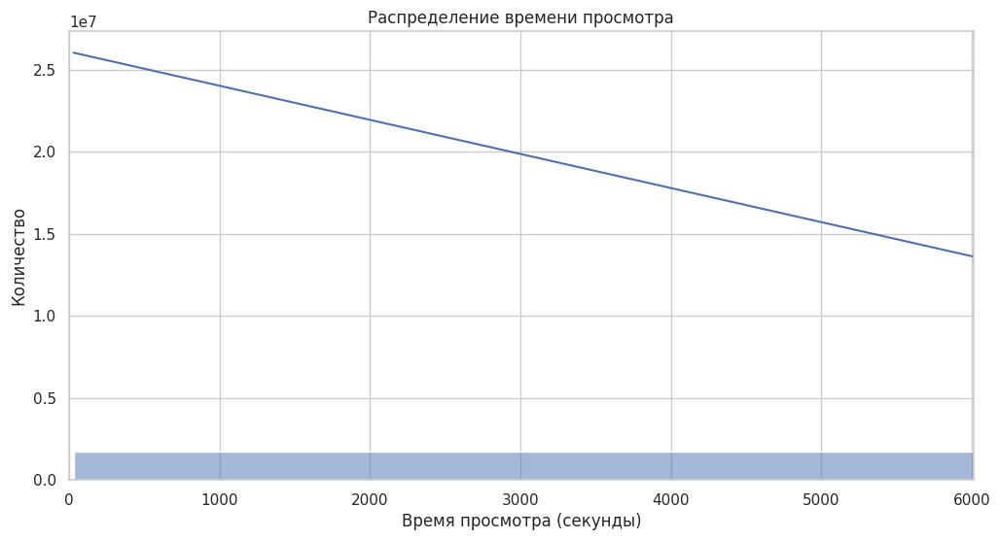

In [9]:
# Гистограмма времени просмотра с ограничением до 95-го перцентиля
plt.figure(figsize=(12, 6))
sns.histplot(data=train_data, x='total_watchtime', bins=50, kde=True)
plt.title('Распределение времени просмотра')
plt.xlabel('Время просмотра (секунды)')
plt.ylabel('Количество')
plt.xlim(0, train_data['total_watchtime'].quantile(0.95))
plt.show()


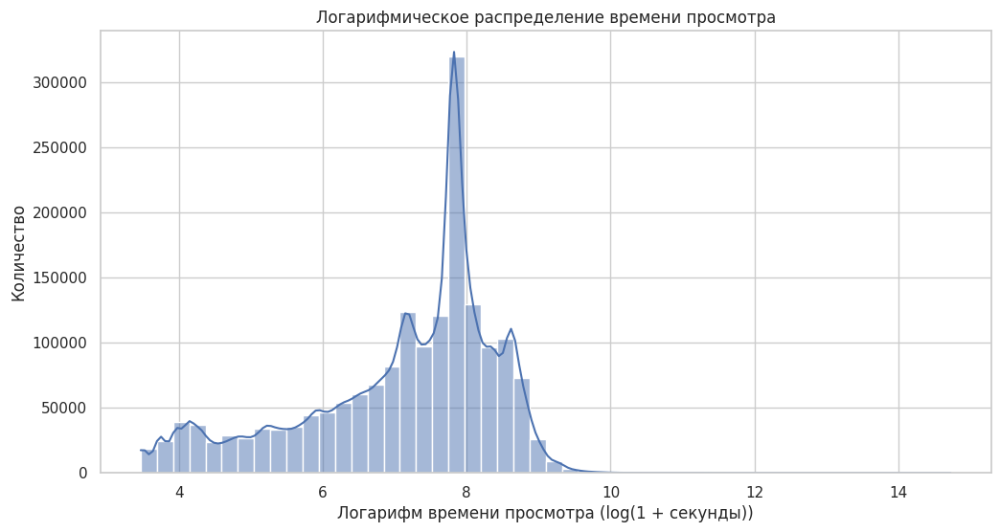

In [10]:
# Добавление столбца с логарифмом времени просмотра
train_data['log_total_watchtime'] = np.log1p(train_data['total_watchtime'])  # log(1 + x)

# Визуализация логарифмически трансформированных данных
plt.figure(figsize=(12, 6))
sns.histplot(data=train_data, x='log_total_watchtime', bins=50, kde=True)
plt.title('Логарифмическое распределение времени просмотра')
plt.xlabel('Логарифм времени просмотра (log(1 + секунды))')
plt.ylabel('Количество')
plt.show()


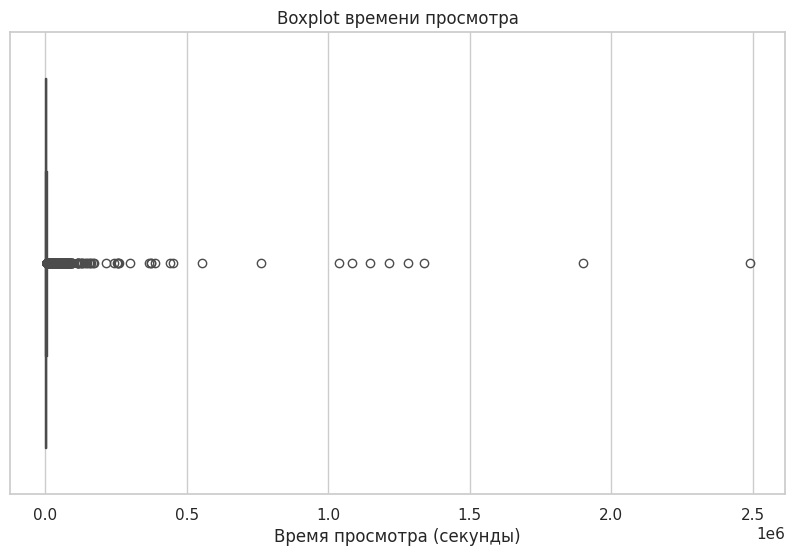

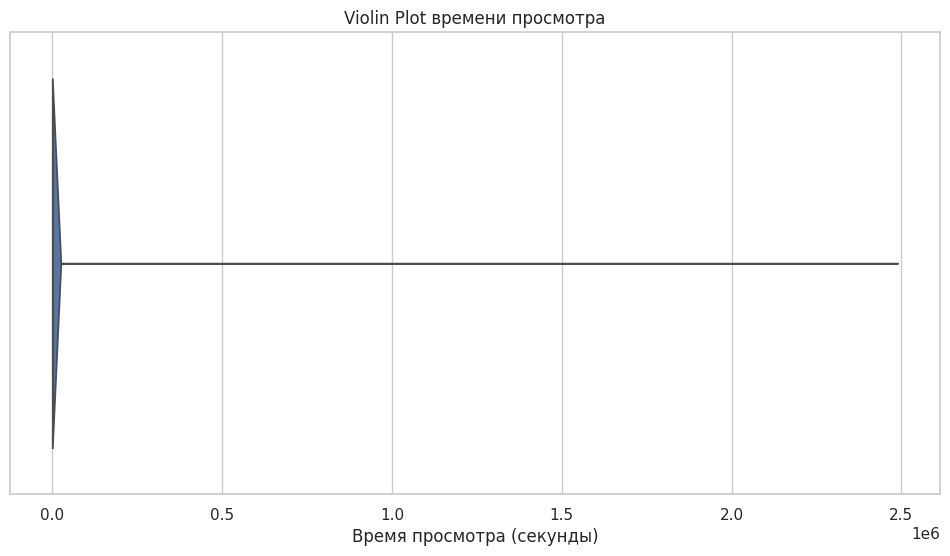

In [11]:
# Boxplot времени просмотра
plt.figure(figsize=(10, 6))
sns.boxplot(x='total_watchtime', data=train_data)
plt.title('Boxplot времени просмотра')
plt.xlabel('Время просмотра (секунды)')
plt.show()

# Violin Plot времени просмотра
plt.figure(figsize=(12, 6))
sns.violinplot(x='total_watchtime', data=train_data, inner='quartile')
plt.title('Violin Plot времени просмотра')
plt.xlabel('Время просмотра (секунды)')
plt.show()


/tmp/ipykernel_257251/3944956982.py:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


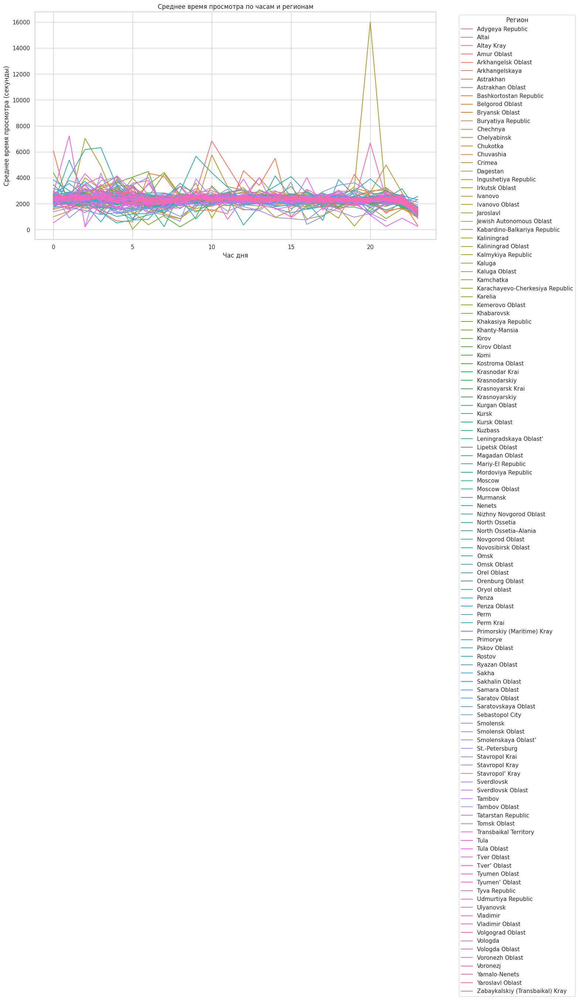

In [12]:
# Среднее время просмотра по часам и регионам
avg_watchtime_hour_region = train_data.groupby(['region', 'event_hour'])['total_watchtime'].mean().reset_index()

# Визуализация
plt.figure(figsize=(14, 8))
sns.lineplot(data=avg_watchtime_hour_region, x='event_hour', y='total_watchtime', hue='region')
plt.title('Среднее время просмотра по часам и регионам')
plt.xlabel('Час дня')
plt.ylabel('Среднее время просмотра (секунды)')
plt.legend(title='Регион', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


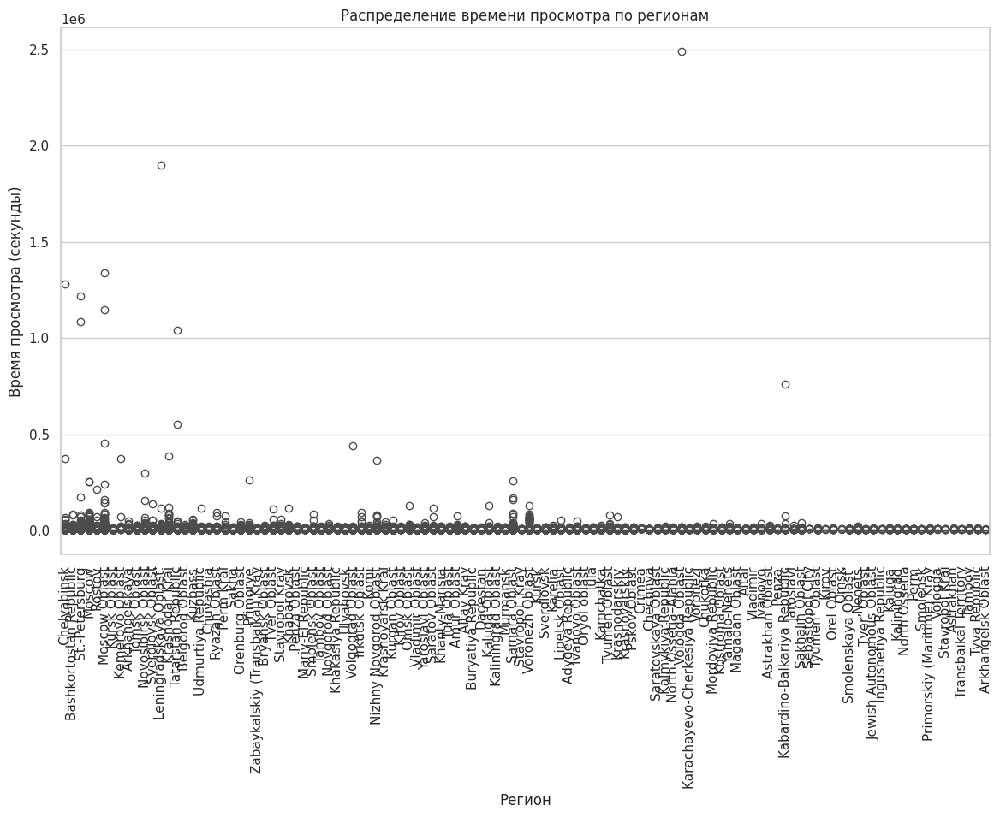

In [13]:
# Распределение времени просмотра по регионам
plt.figure(figsize=(14, 8))
sns.boxplot(x='region', y='total_watchtime', data=train_data)
plt.title('Распределение времени просмотра по регионам')
plt.xlabel('Регион')
plt.ylabel('Время просмотра (секунды)')
plt.xticks(rotation=90)
plt.show()


Пиковые часы активности по регионам:
               region  peak_hour
0    Adygeya Republic         22
1               Altai         16
2          Altay Kray         17
3         Amur Oblast         14
4  Arkhangelsk Oblast         19


/tmp/ipykernel_257251/415075590.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=peak_hours_region, x='region', y='peak_hour', palette='viridis')


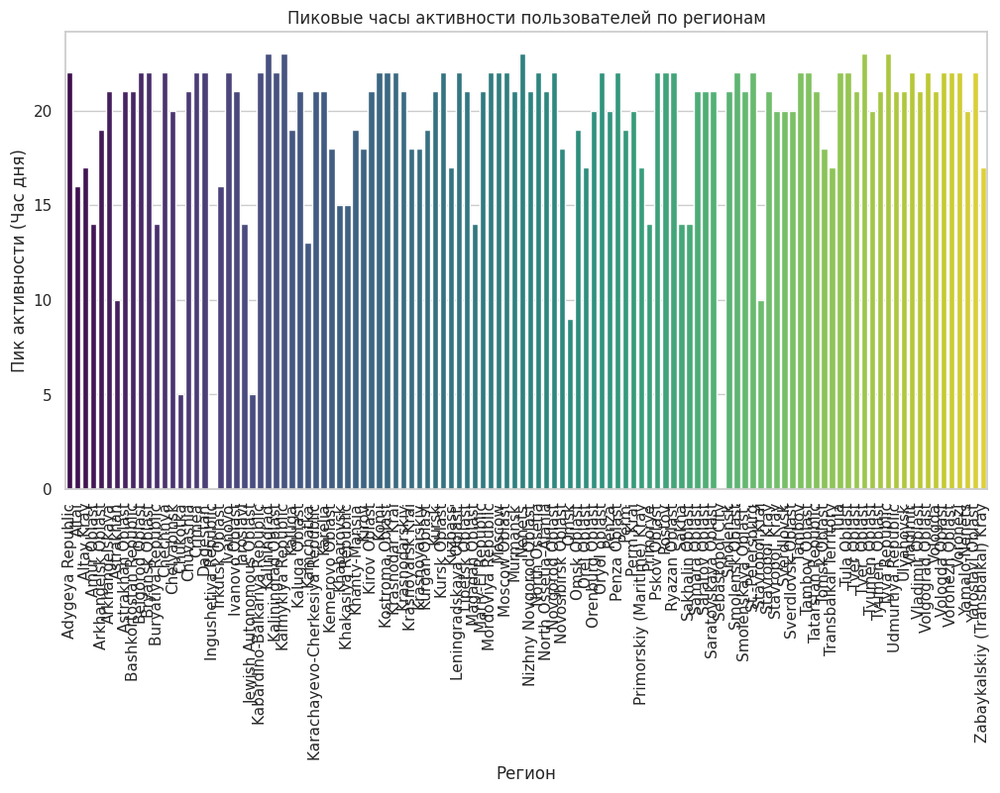

In [14]:
# Определение пиковых часов активности по регионам
peak_hours_region = train_data.groupby('region')['event_hour'].agg(lambda x: x.mode()[0]).reset_index()
peak_hours_region.rename(columns={'event_hour': 'peak_hour'}, inplace=True)

print("Пиковые часы активности по регионам:")
print(peak_hours_region.head())

# Визуализация пиковых часов по регионам
plt.figure(figsize=(12, 6))
sns.barplot(data=peak_hours_region, x='region', y='peak_hour', palette='viridis')
plt.title('Пиковые часы активности пользователей по регионам')
plt.xlabel('Регион')
plt.ylabel('Пик активности (Час дня)')
plt.xticks(rotation=90)
plt.show()


In [15]:
# Определение числовых столбцов, исключая 'rutube_video_id' и 'viewer_uid'
numeric_cols = ['total_watchtime', 'age', 'age_class', 'duration', 'author_id']

# Заполнение пропусков в числовых столбцах медианой
for col in numeric_cols:
    # Проверка типа данных столбца
    if pd.api.types.is_numeric_dtype(train_data[col]):
        median_value = train_data[col].median()
        train_data[col] = train_data[col].fillna(median_value)
        print(f"Пропуски в '{col}' заполнены медианой: {median_value}")
    else:
        print(f"Столбец '{col}' не является числовым и пропусков не заполняется.")

# Проверка пропусков после заполнения
print("\nПропуски после заполнения:")
print(train_data[numeric_cols].isnull().sum())



Пропуски в 'total_watchtime' заполнены медианой: 1859.0
Пропуски в 'age' заполнены медианой: 33.0
Пропуски в 'age_class' заполнены медианой: 2.0
Пропуски в 'duration' заполнены медианой: 2760427.0
Пропуски в 'author_id' заполнены медианой: 1009257.0

Пропуски после заполнения:
total_watchtime    0
age                0
age_class          0
duration           0
author_id          0
dtype: int64


In [16]:
# Проверка наличия столбца 'age_range'
if 'age_range' not in train_data.columns:
    age_class_mapping = {
        0: '9-20',
        1: '21-30',
        2: '31-40',
        3: '41-60'
    }
    train_data['age_range'] = train_data['age_class'].map(age_class_mapping)
    print("Столбец 'age_range' успешно добавлен.")
else:
    print("Столбец 'age_range' уже существует в train_data.")

# Проверка создания 'age_range'
print(train_data[['age_class', 'age_range']].head())


Столбец 'age_range' успешно добавлен.
   age_class age_range
0          0      9-20
1          2     31-40
2          1     21-30
3          3     41-60
4          2     31-40


In [17]:
# Проверка пропусков в 'age_range'
missing_age_range = train_data['age_range'].isnull().sum()
print(f"Количество пропусков в 'age_range': {missing_age_range}")

# Если есть пропуски, заполняем их значением 'Unknown'
if missing_age_range > 0:
    train_data['age_range'] = train_data['age_range'].fillna('Unknown')
    print("Пропуски в 'age_range' заполнены значением 'Unknown'.")


Количество пропусков в 'age_range': 0


In [18]:
# Преобразование 'event_timestamp' в тип datetime
train_data['event_timestamp'] = pd.to_datetime(train_data['event_timestamp'], errors='coerce')

# Извлечение признаков из 'event_timestamp'
train_data['event_hour'] = train_data['event_timestamp'].dt.hour
train_data['event_dayofweek'] = train_data['event_timestamp'].dt.dayofweek  # 0: Monday, 6: Sunday
train_data['event_month'] = train_data['event_timestamp'].dt.month

# Проверка новых признаков
print("Новые признаки из 'event_timestamp':")
print(train_data[['event_timestamp', 'event_hour', 'event_dayofweek', 'event_month']].head())


Новые признаки из 'event_timestamp':
            event_timestamp  event_hour  event_dayofweek  event_month
0 2024-06-01 06:40:58+03:00           6                5            6
1 2024-06-01 19:33:24+03:00          19                5            6
2 2024-06-01 21:30:43+03:00          21                5            6
3 2024-06-01 23:03:42+03:00          23                5            6
4 2024-06-01 22:48:09+03:00          22                5            6


In [19]:
# Описательная статистика для 'total_watchtime'
print("Описательная статистика 'total_watchtime':")
print(train_data['total_watchtime'].describe())


Описательная статистика 'total_watchtime':
count    1.759616e+06
mean     2.203427e+03
std      4.027573e+03
min      3.100000e+01
25%      5.820000e+02
50%      1.859000e+03
75%      2.902000e+03
max      2.489070e+06
Name: total_watchtime, dtype: float64


/tmp/ipykernel_257251/3118347141.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_watchtime_age, x='age_range', y='total_watchtime', palette='magma')


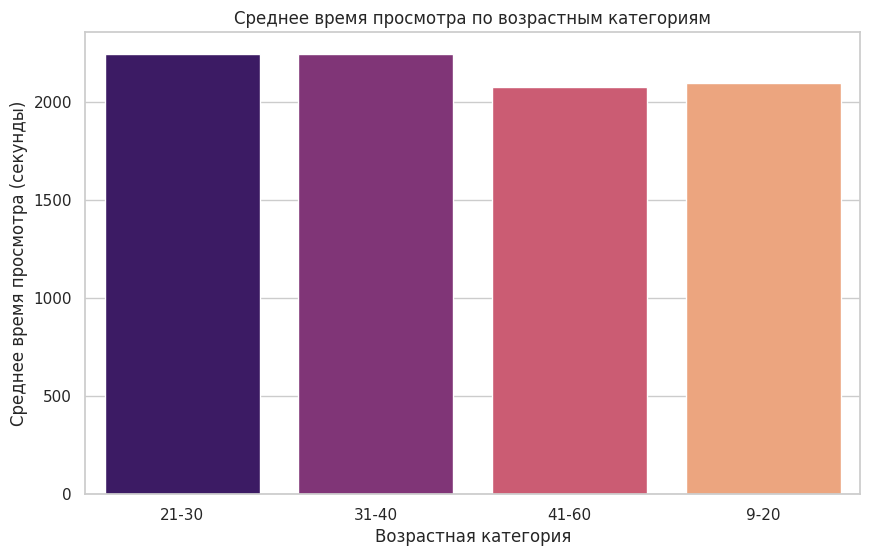

In [20]:
# Среднее время просмотра по возрастным категориям
avg_watchtime_age = train_data.groupby('age_range')['total_watchtime'].mean().reset_index()

# Визуализация
plt.figure(figsize=(10, 6))
sns.barplot(data=avg_watchtime_age, x='age_range', y='total_watchtime', palette='magma')
plt.title('Среднее время просмотра по возрастным категориям')
plt.xlabel('Возрастная категория')
plt.ylabel('Среднее время просмотра (секунды)')
plt.show()


/tmp/ipykernel_257251/2747920791.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_watchtime_os, x='ua_os', y='total_watchtime', palette='Set2')


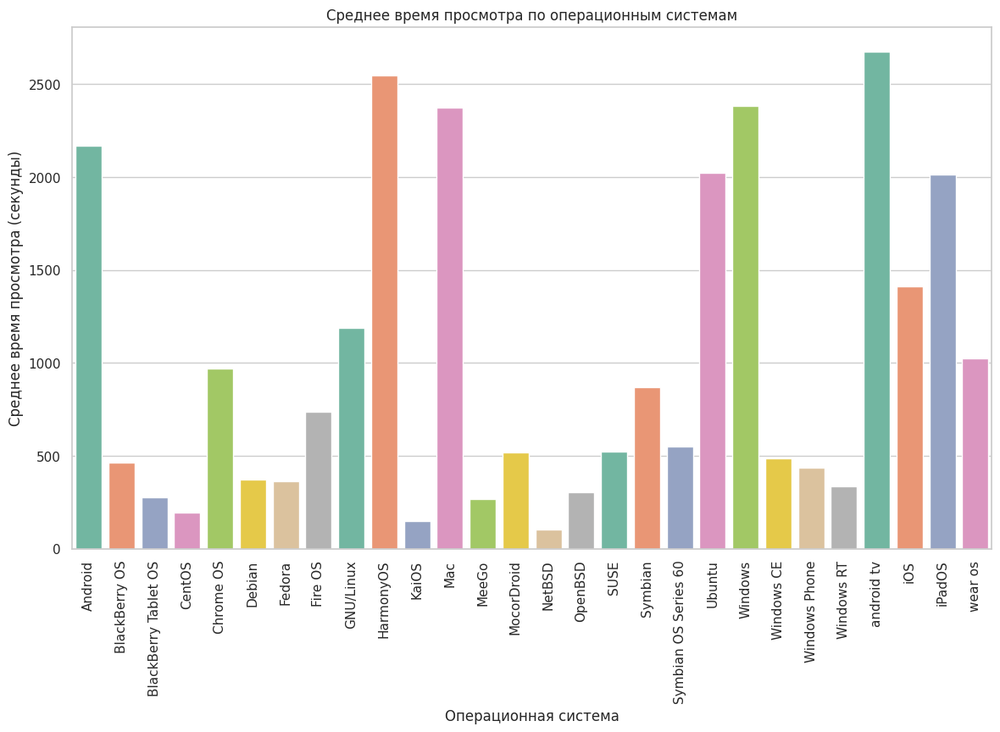

In [21]:
# Среднее время просмотра по операционным системам
avg_watchtime_os = train_data.groupby('ua_os')['total_watchtime'].mean().reset_index()

# Визуализация
plt.figure(figsize=(14, 8))
sns.barplot(data=avg_watchtime_os, x='ua_os', y='total_watchtime', palette='Set2')
plt.title('Среднее время просмотра по операционным системам')
plt.xlabel('Операционная система')
plt.ylabel('Среднее время просмотра (секунды)')
plt.xticks(rotation=90)
plt.show()


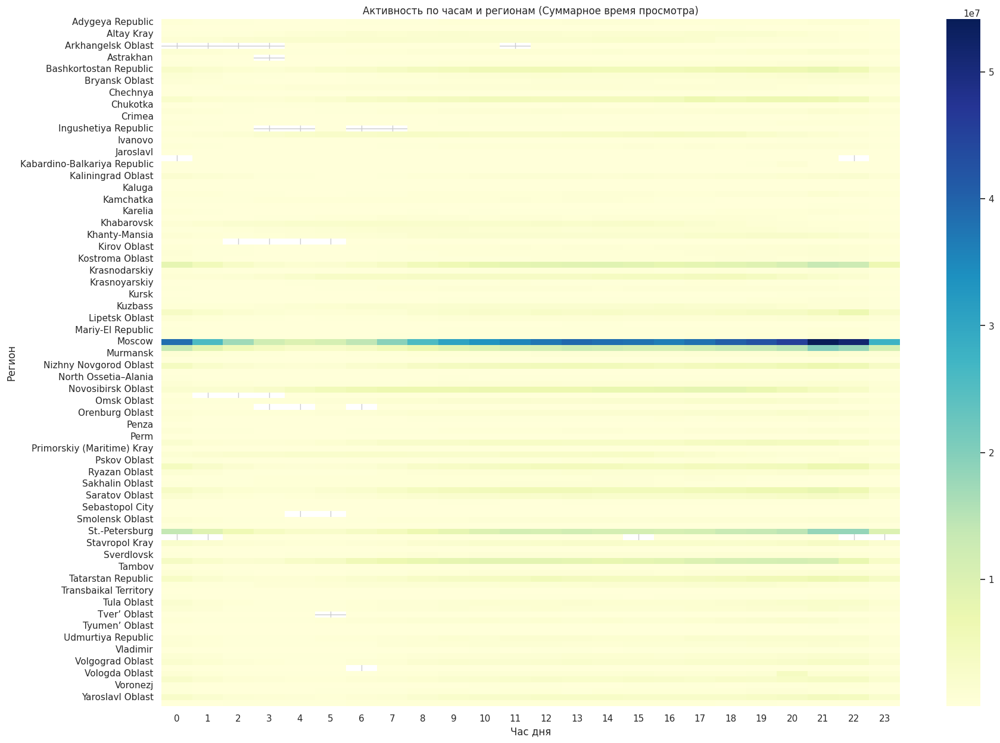

In [22]:
# Создание сводной таблицы для тепловой карты
pivot_table = train_data.pivot_table(index='region', columns='event_hour', values='total_watchtime', aggfunc='sum')

# Визуализация тепловой карты
plt.figure(figsize=(20, 15))
sns.heatmap(pivot_table, cmap='YlGnBu')
plt.title('Активность по часам и регионам (Суммарное время просмотра)')
plt.xlabel('Час дня')
plt.ylabel('Регион')
plt.show()


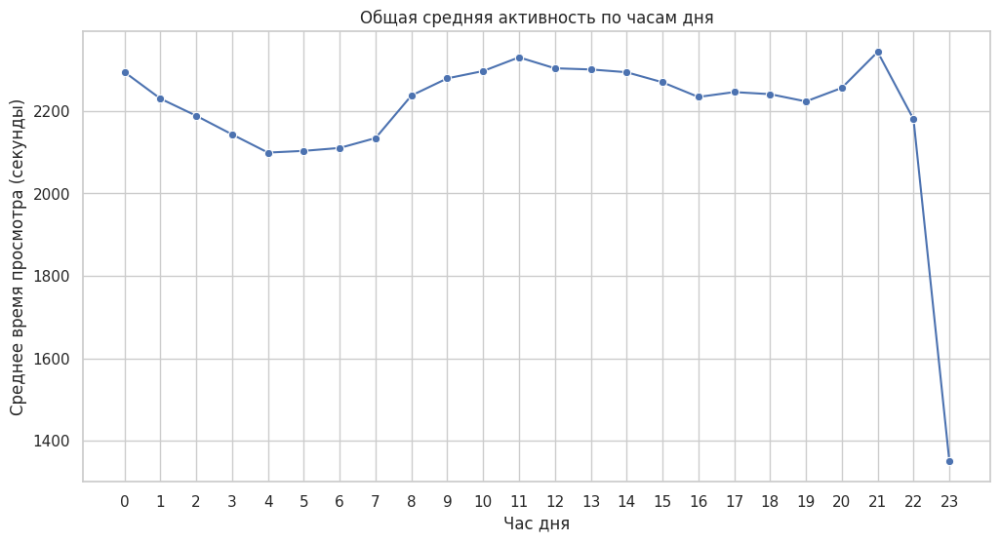

In [23]:
# Группировка данных по часам для общей активности
avg_watchtime_hour = train_data.groupby('event_hour')['total_watchtime'].mean().reset_index()

# Визуализация
plt.figure(figsize=(12, 6))
sns.lineplot(data=avg_watchtime_hour, x='event_hour', y='total_watchtime', marker='o')
plt.title('Общая средняя активность по часам дня')
plt.xlabel('Час дня')
plt.ylabel('Среднее время просмотра (секунды)')
plt.xticks(range(0, 24))
plt.show()


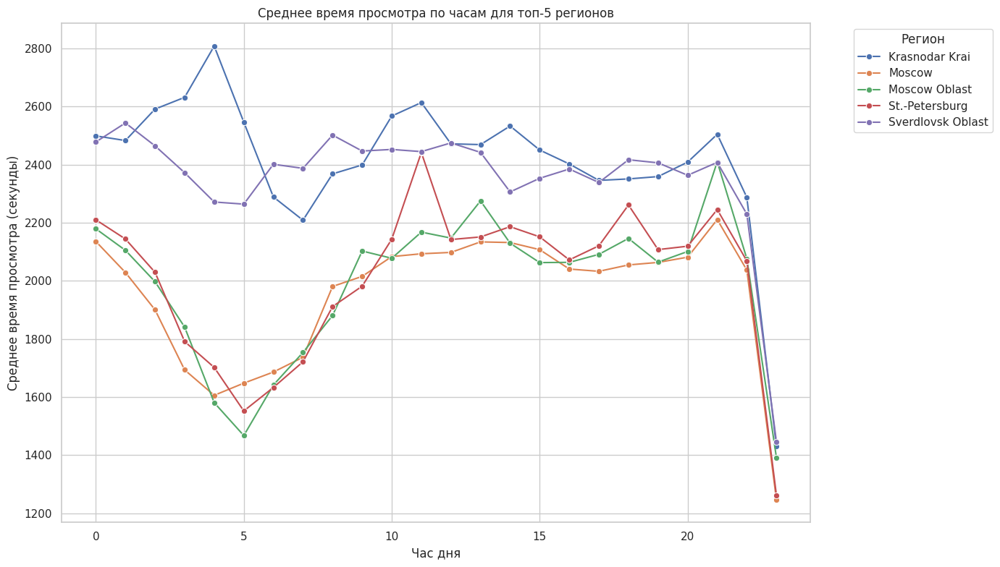

In [24]:
# Предположим, что мы хотим сравнить активность между несколькими основными регионами
top_regions = train_data['region'].value_counts().nlargest(5).index  # Топ-5 регионов по количеству записей

# Фильтрация данных для топ-5 регионов
top_regions_data = train_data[train_data['region'].isin(top_regions)]

# Среднее время просмотра по часам и топ-регионам
avg_watchtime_top_regions = top_regions_data.groupby(['region', 'event_hour'])['total_watchtime'].mean().reset_index()

# Визуализация
plt.figure(figsize=(14, 8))
sns.lineplot(data=avg_watchtime_top_regions, x='event_hour', y='total_watchtime', hue='region', marker='o')
plt.title('Среднее время просмотра по часам для топ-5 регионов')
plt.xlabel('Час дня')
plt.ylabel('Среднее время просмотра (секунды)')
plt.legend(title='Регион', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


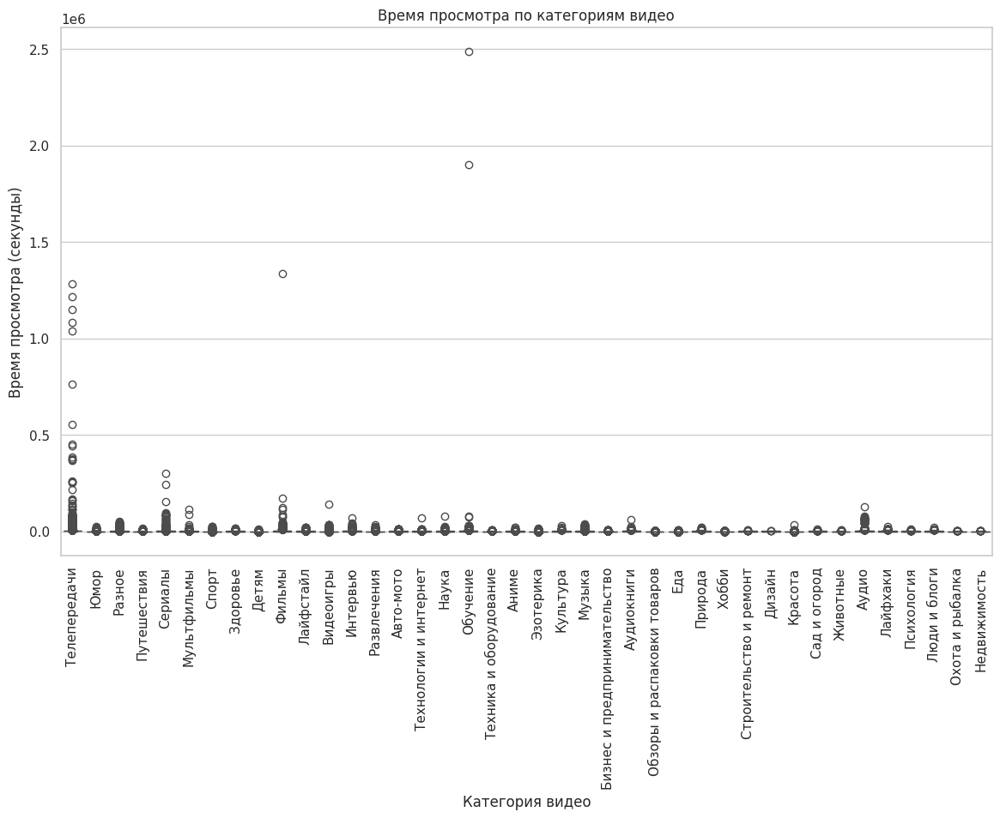

In [25]:
plt.figure(figsize=(14, 8))
sns.boxplot(x='category', y='total_watchtime', data=train_data)
plt.title('Время просмотра по категориям видео')
plt.xlabel('Категория видео')
plt.ylabel('Время просмотра (секунды)')
plt.xticks(rotation=90)
plt.show()


/tmp/ipykernel_257251/2324095316.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_watchtime_category, x='category', y='total_watchtime', palette='viridis')


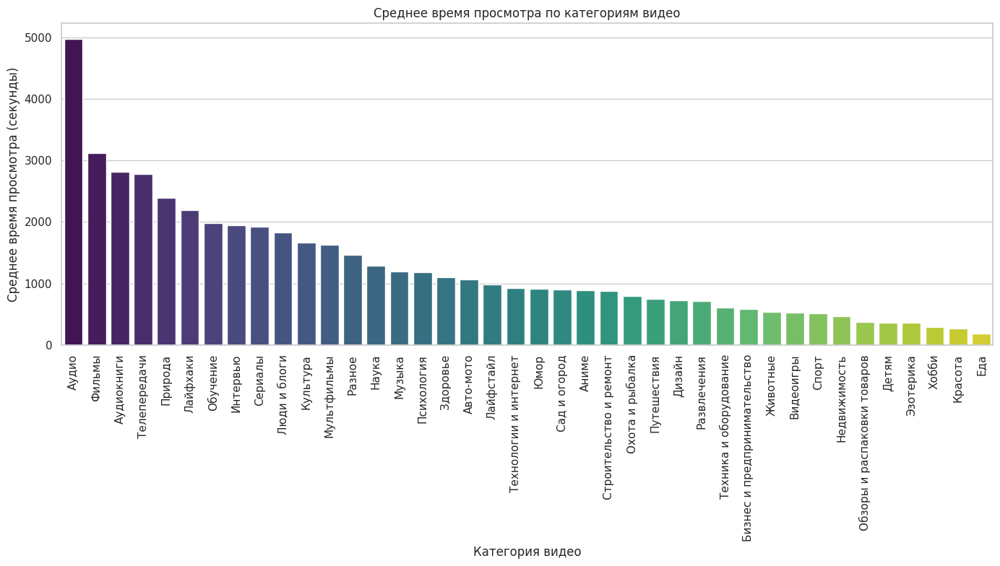

In [26]:
# Среднее время просмотра по категориям видео
avg_watchtime_category = train_data.groupby('category')['total_watchtime'].mean().reset_index()

# Сортировка по убыванию среднего времени просмотра
avg_watchtime_category = avg_watchtime_category.sort_values(by='total_watchtime', ascending=False)

# Визуализация
plt.figure(figsize=(14, 8))
sns.barplot(data=avg_watchtime_category, x='category', y='total_watchtime', palette='viridis')
plt.title('Среднее время просмотра по категориям видео')
plt.xlabel('Категория видео')
plt.ylabel('Среднее время просмотра (секунды)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


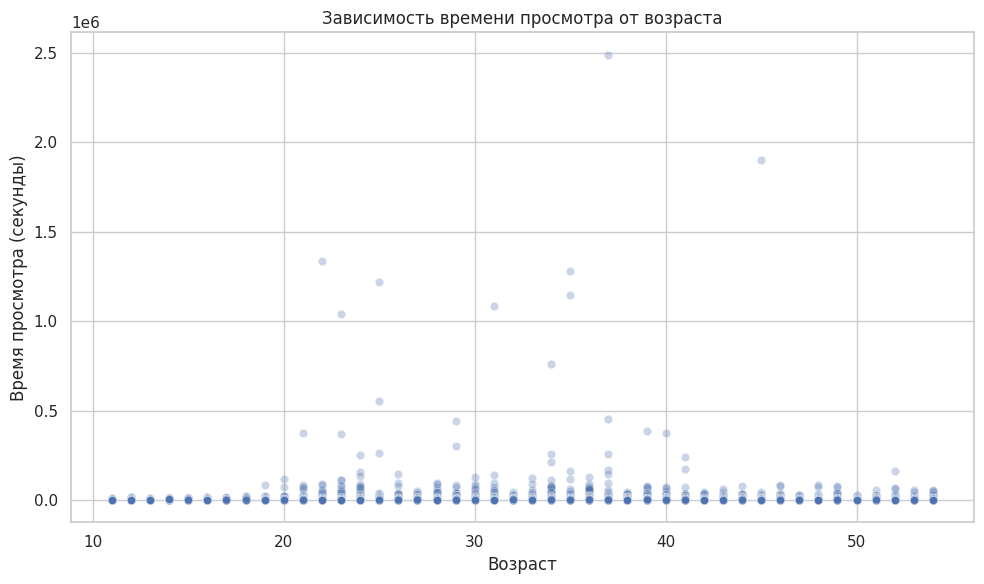

In [27]:
# Визуализация зависимости времени просмотра от возраста
plt.figure(figsize=(10, 6))
sns.scatterplot(data=train_data, x='age', y='total_watchtime', alpha=0.3)
plt.title('Зависимость времени просмотра от возраста')
plt.xlabel('Возраст')
plt.ylabel('Время просмотра (секунды)')
plt.tight_layout()
plt.show()


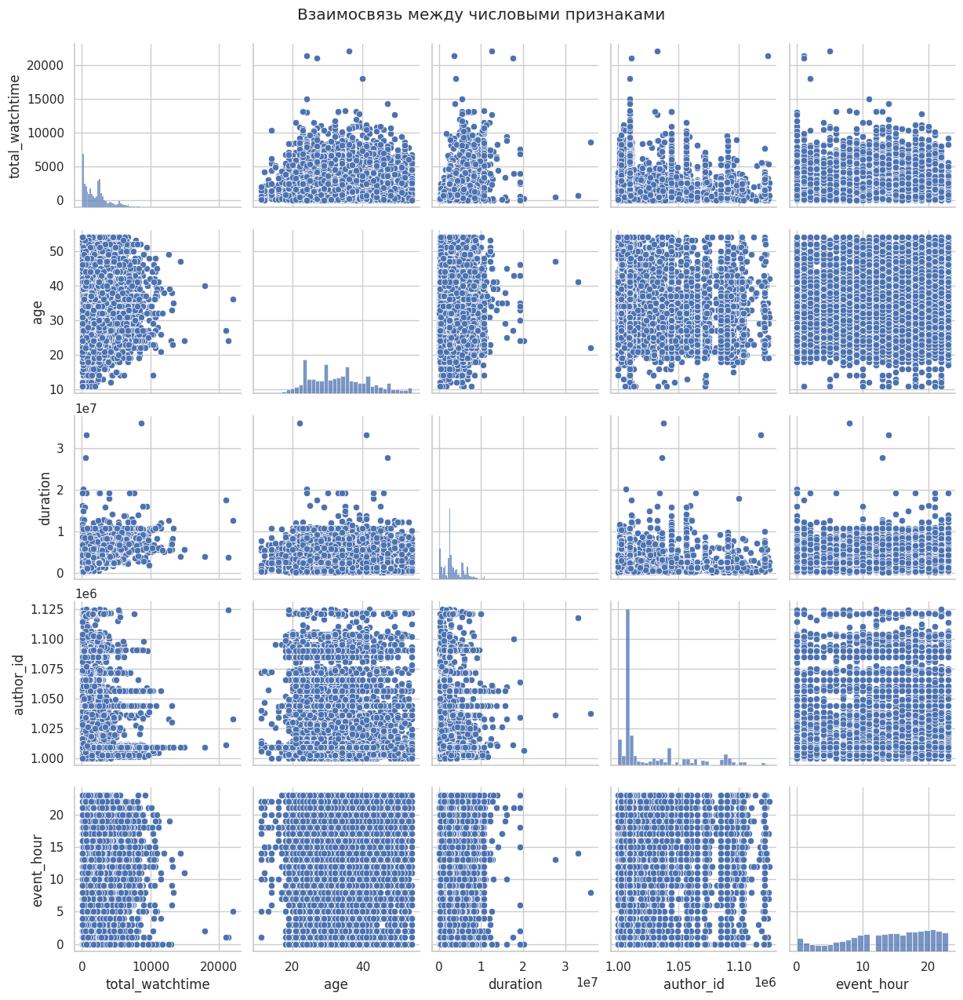

In [28]:
# Выбор подмножества данных для Pairplot
pairplot_data = train_data[['total_watchtime', 'age', 'duration', 'author_id', 'event_hour']].sample(n=10000, random_state=42)

# Визуализация Pairplot
sns.pairplot(pairplot_data)
plt.suptitle('Взаимосвязь между числовыми признаками', y=1.02)
plt.show()


In [29]:
# Определение топ-5 регионов по количеству записей
top_regions = train_data['region'].value_counts().nlargest(5).index
print("Топ-5 регионов по количеству просмотров:")
for i, region in enumerate(top_regions, 1):
    print(f"{i}. {region}")


Топ-5 регионов по количеству просмотров:
1. Moscow
2. Moscow Oblast
3. St.-Petersburg
4. Sverdlovsk Oblast
5. Krasnodar Krai


In [30]:
# Фильтрация данных для топ-5 регионов
top_regions_data = train_data[train_data['region'].isin(top_regions)]
print(f"Количество записей после фильтрации: {top_regions_data.shape[0]}")


Количество записей после фильтрации: 761256


In [31]:
# Группировка данных по региону и часу для подсчёта количества просмотров
views_per_hour_region = top_regions_data.groupby(['region', 'event_hour']).size().reset_index(name='view_count')

# Проверка полученных данных
print("Пример сгруппированных данных:")
print(views_per_hour_region.head())


Пример сгруппированных данных:
           region  event_hour  view_count
0  Krasnodar Krai           0        3285
1  Krasnodar Krai           1        2067
2  Krasnodar Krai           2        1218
3  Krasnodar Krai           3         743
4  Krasnodar Krai           4         500


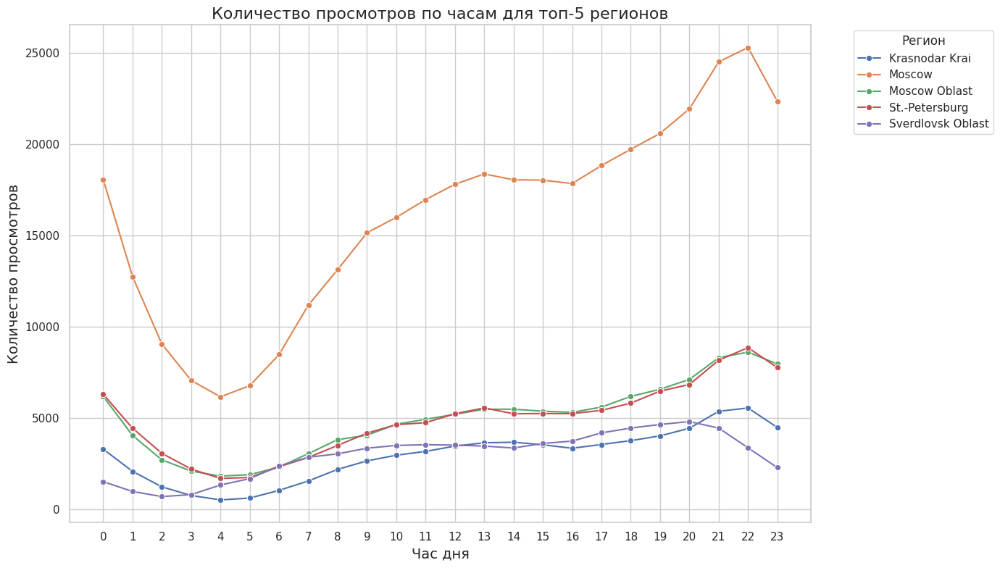

In [32]:
# Визуализация количества просмотров по часам для топ-5 регионов
plt.figure(figsize=(14, 8))
sns.lineplot(data=views_per_hour_region, x='event_hour', y='view_count', hue='region', marker='o')

# Настройка заголовка и подписей осей
plt.title('Количество просмотров по часам для топ-5 регионов', fontsize=16)
plt.xlabel('Час дня', fontsize=14)
plt.ylabel('Количество просмотров', fontsize=14)

# Настройка легенды
plt.legend(title='Регион', bbox_to_anchor=(1.05, 1), loc='upper left')

# Установка диапазона оси X от 0 до 23
plt.xticks(range(0, 24))

# Оптимизация расположения элементов графика
plt.tight_layout()

# Отображение графика
plt.show()


In [33]:
# Среднее время просмотра по дням недели
avg_watchtime_day = train_data.groupby('event_dayofweek')['total_watchtime'].mean().reset_index()


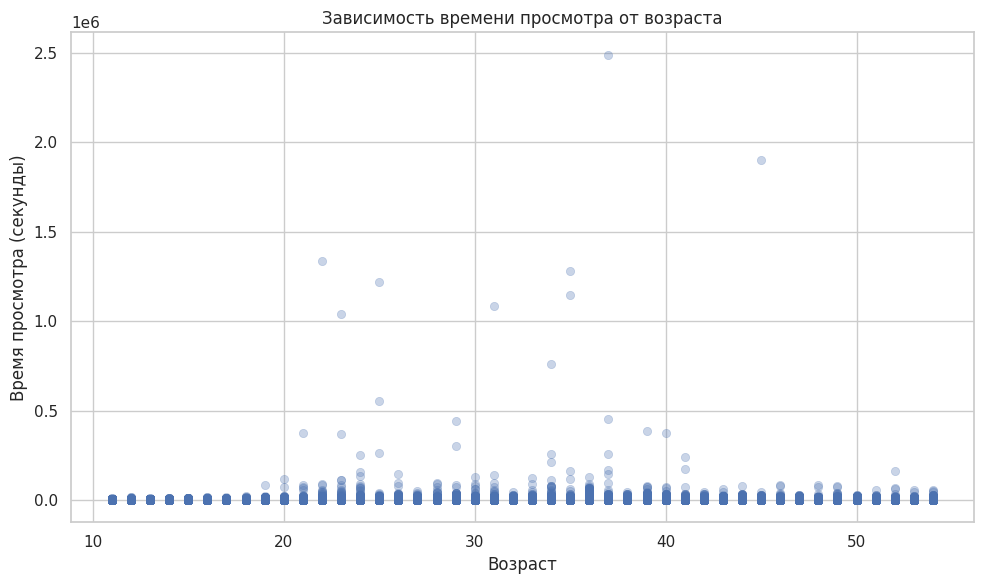

In [34]:
# Визуализация зависимости времени просмотра от возраста
plt.figure(figsize=(10, 6))
sns.scatterplot(data=train_data, x='age', y='total_watchtime', alpha=0.3, edgecolor=None)
plt.title('Зависимость времени просмотра от возраста')
plt.xlabel('Возраст')
plt.ylabel('Время просмотра (секунды)')
plt.tight_layout()
plt.show()


In [35]:
# Определение топ-15 регионов по количеству записей
top_15_regions = train_data['region'].value_counts().nlargest(15).index
print("Топ-15 регионов по количеству просмотров:")
for i, region in enumerate(top_15_regions, 1):
    print(f"{i}. {region}")


Топ-15 регионов по количеству просмотров:
1. Moscow
2. Moscow Oblast
3. St.-Petersburg
4. Sverdlovsk Oblast
5. Krasnodar Krai
6. Novosibirsk Oblast
7. Bashkortostan Republic
8. Samara Oblast
9. Nizhny Novgorod Oblast
10. Chelyabinsk
11. Tatarstan Republic
12. Rostov
13. Krasnoyarsk Krai
14. Perm Krai
15. Leningradskaya Oblast'


In [36]:
# Фильтрация данных для топ-15 регионов
top_15_regions_data = train_data[train_data['region'].isin(top_15_regions)]
print(f"Количество записей после фильтрации: {top_15_regions_data.shape[0]}")


Количество записей после фильтрации: 1161956


In [37]:
# Группировка данных по региону и часу для подсчёта количества просмотров
views_per_hour_region_15 = top_15_regions_data.groupby(['region', 'event_hour']).size().reset_index(name='view_count')

# Проверка полученных данных
print("Пример сгруппированных данных:")
print(views_per_hour_region_15.head())


Пример сгруппированных данных:
                   region  event_hour  view_count
0  Bashkortostan Republic           0        1284
1  Bashkortostan Republic           1         867
2  Bashkortostan Republic           2         626
3  Bashkortostan Republic           3         593
4  Bashkortostan Republic           4         736


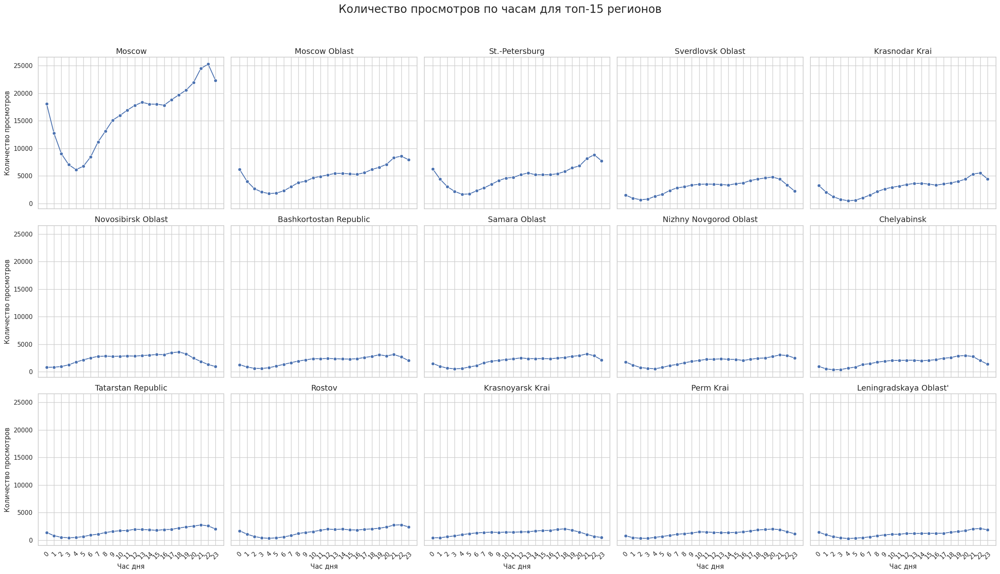

In [38]:
# Импорт необходимых библиотек (если еще не импортированы)
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Настройка стиля визуализаций (если еще не настроены)
sns.set(style='whitegrid')
%matplotlib inline

# Определение количества подграфиков (например, 3 строки по 5 графиков)
num_plots = 15
plots_per_row = 5
num_rows = num_plots // plots_per_row + int(num_plots % plots_per_row > 0)

# Создание фигуры и осей
fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(25, num_rows * 5), sharex=True, sharey=True)

# Преобразование axes в одномерный массив для удобства итерации
axes = axes.flatten()

# Перебор топ-15 регионов и построение графиков
for i, region in enumerate(top_15_regions):
    region_data = views_per_hour_region_15[views_per_hour_region_15['region'] == region]
    sns.lineplot(ax=axes[i], data=region_data, x='event_hour', y='view_count', marker='o')
    axes[i].set_title(f"{region}", fontsize=14)
    axes[i].set_xlabel('Час дня', fontsize=12)
    axes[i].set_ylabel('Количество просмотров', fontsize=12)
    axes[i].set_xticks(range(0, 24))
    axes[i].tick_params(axis='x', rotation=45)
    
# Удаление лишних подграфиков (если есть)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Настройка общего заголовка
plt.suptitle('Количество просмотров по часам для топ-15 регионов', fontsize=20)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Отображение графика
plt.show()


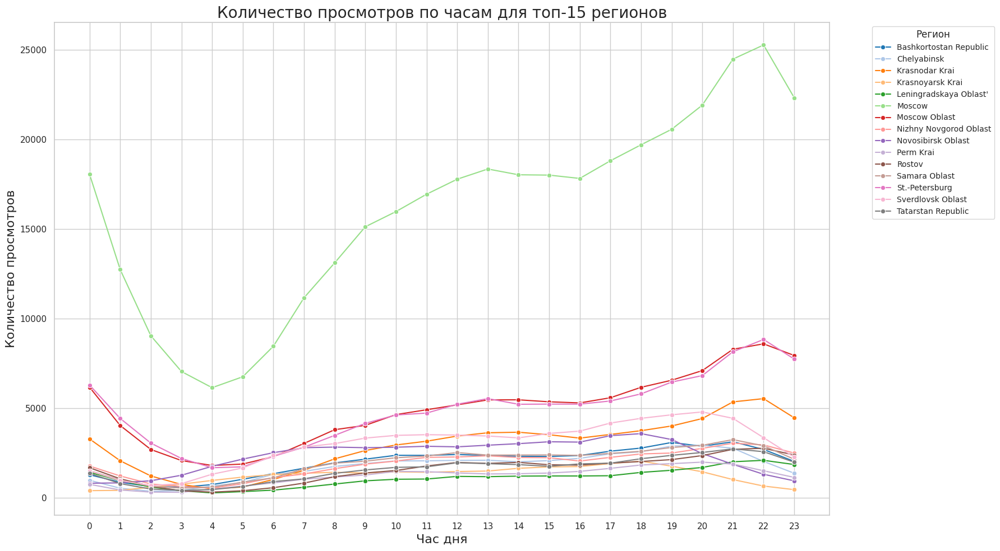

In [39]:
# Визуализация количества просмотров по часам для топ-15 регионов в одном графике
plt.figure(figsize=(18, 10))
sns.lineplot(data=views_per_hour_region_15, x='event_hour', y='view_count', hue='region', marker='o', palette='tab20')

# Настройка заголовка и подписей осей
plt.title('Количество просмотров по часам для топ-15 регионов', fontsize=20)
plt.xlabel('Час дня', fontsize=16)
plt.ylabel('Количество просмотров', fontsize=16)

# Настройка легенды
plt.legend(title='Регион', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10, title_fontsize=12)

# Установка диапазона оси X от 0 до 23
plt.xticks(range(0, 24))

# Оптимизация расположения элементов графика
plt.tight_layout()

# Отображение графика
plt.show()


In [40]:
import plotly.express as px

# Создание интерактивного линейного графика
fig = px.line(
    views_per_hour_region_15,
    x='event_hour',
    y='view_count',
    color='region',
    markers=True,
    title='Количество просмотров по часам для топ-15 регионов'
)

# Настройка отображения легенды
fig.update_layout(
    xaxis_title='Час дня',
    yaxis_title='Количество просмотров',
    legend_title='Регион',
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    )
)

# Отображение графика
fig.show()


Общее количество регионов: 116


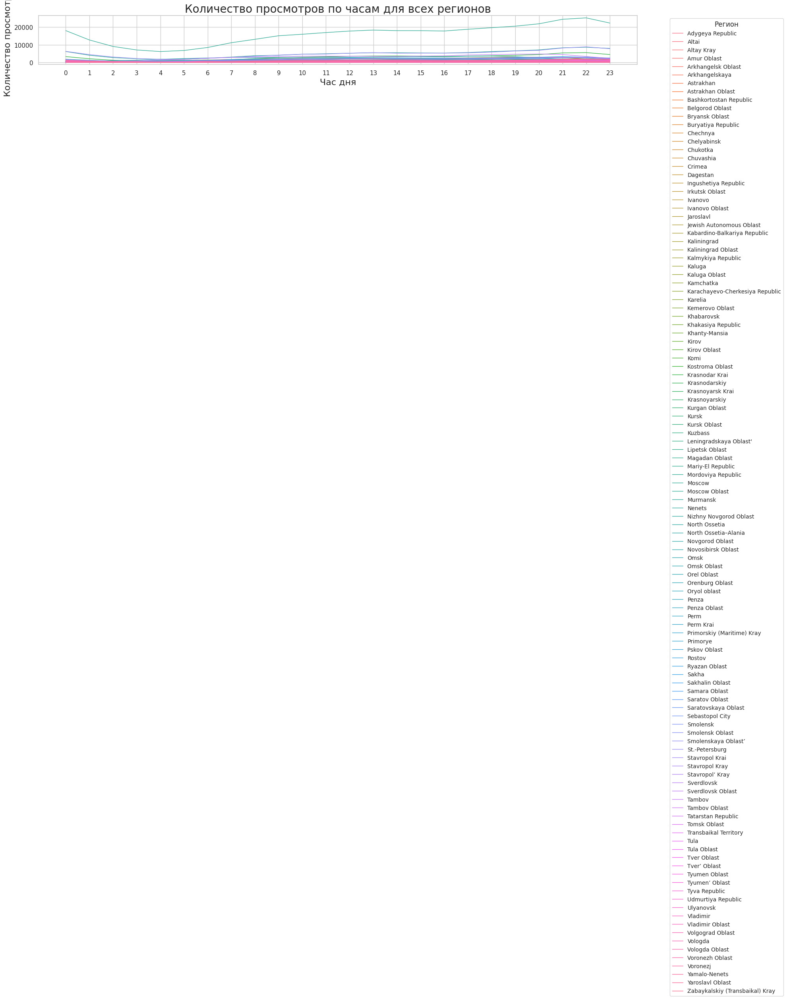

In [41]:
# Группировка данных по региону и часу для подсчёта количества просмотров
views_per_hour_all_regions = train_data.groupby(['region', 'event_hour']).size().reset_index(name='view_count')

# Определение общего количества регионов
total_regions = views_per_hour_all_regions['region'].nunique()
print(f"Общее количество регионов: {total_regions}")

# Визуализация количества просмотров по часам для всех регионов
plt.figure(figsize=(20, 15))
sns.lineplot(data=views_per_hour_all_regions, x='event_hour', y='view_count', hue='region', linewidth=1)

# Настройка заголовка и подписей осей
plt.title('Количество просмотров по часам для всех регионов', fontsize=20)
plt.xlabel('Час дня', fontsize=16)
plt.ylabel('Количество просмотров', fontsize=16)

# Настройка легенды
plt.legend(title='Регион', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10, title_fontsize=12)

# Установка диапазона оси X от 0 до 23
plt.xticks(range(0, 24))

# Оптимизация расположения элементов графика
plt.tight_layout()

# Отображение графика
plt.show()


In [42]:
import plotly.express as px

# Создание интерактивного линейного графика
fig = px.line(
    views_per_hour_all_regions,
    x='event_hour',
    y='view_count',
    color='region',
    title='Количество просмотров по часам для всех регионов',
    markers=True,
    hover_data=['region', 'event_hour', 'view_count']
)

# Настройка осей
fig.update_layout(
    xaxis_title='Час дня',
    yaxis_title='Количество просмотров',
    legend_title='Регион',
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    )
)

# Отображение графика
fig.show()


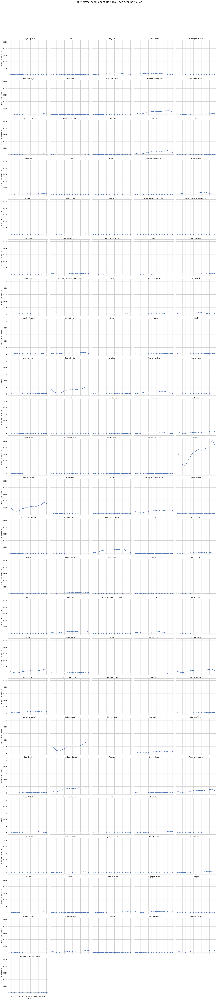

In [43]:
# Определение количества регионов и создание сетки подграфиков
num_regions = views_per_hour_all_regions['region'].nunique()
plots_per_row = 5
num_rows = num_regions // plots_per_row + int(num_regions % plots_per_row > 0)

# Создание фигуры и осей
fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(25, num_rows * 5), sharex=True, sharey=True)

# Преобразование axes в одномерный массив для удобства итерации
axes = axes.flatten()

# Перебор регионов и построение графиков
for i, region in enumerate(views_per_hour_all_regions['region'].unique()):
    region_data = views_per_hour_all_regions[views_per_hour_all_regions['region'] == region]
    sns.lineplot(ax=axes[i], data=region_data, x='event_hour', y='view_count', marker='o')
    axes[i].set_title(f"{region}", fontsize=12)
    axes[i].set_xlabel('Час дня', fontsize=10)
    axes[i].set_ylabel('Количество просмотров', fontsize=10)
    axes[i].set_xticks(range(0, 24))
    axes[i].tick_params(axis='x', rotation=45)

# Удаление лишних подграфиков (если есть)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Настройка общего заголовка
plt.suptitle('Количество просмотров по часам для всех регионов', fontsize=20)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Отображение графика
plt.show()


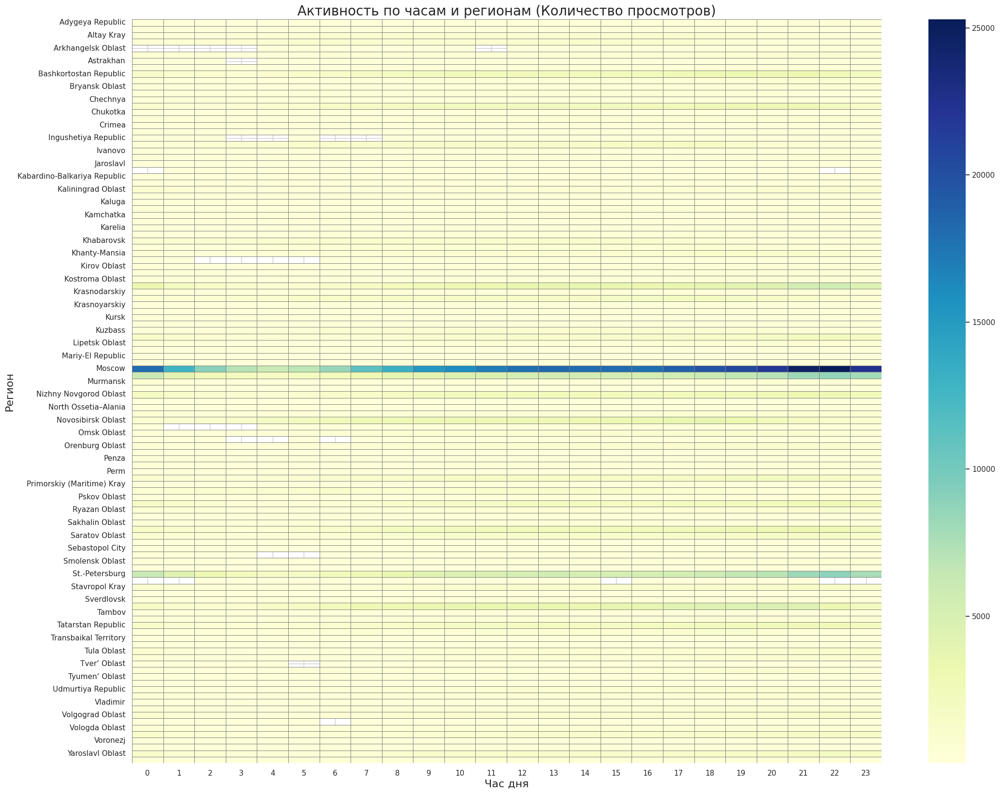

In [44]:
# Создание сводной таблицы для тепловой карты
pivot_table_all = views_per_hour_all_regions.pivot(index='region', columns='event_hour', values='view_count')

# Визуализация тепловой карты
plt.figure(figsize=(25, 20))
sns.heatmap(pivot_table_all, cmap='YlGnBu', linewidths=.5, linecolor='gray')
plt.title('Активность по часам и регионам (Количество просмотров)', fontsize=20)
plt.xlabel('Час дня', fontsize=16)
plt.ylabel('Регион', fontsize=16)
plt.show()


In [45]:
# Создание словаря сопоставления регионов
region_mapping = {
    'Astrakhan Oblast': 'Astrakhan',
    'Arkhangelsk Oblast': 'Arkhangelskaya',
    'Ivanovo Oblast': 'Ivanovo',
    'Kaliningrad Oblast': 'Kaliningrad',
    'Kaluga Oblast': 'Kaluga',
    'Kirov Oblast': 'Kirov',
    'Krasnodar Krai': 'Krasnodarskiy',
    'Krasnoyarsk Krai': 'Krasnoyarskiy',
    'Kursk Oblast': 'Kursk',
    'Omsk Oblast': 'Omsk',
    'Orel Oblast': 'Oryol Oblast',  
    'Penza Oblast': 'Penza',
    'Perm Krai': 'Perm',
    'Primorskiy (Maritime) Kray': 'Primorye',
    'Ryazan Oblast': 'Ryazan Oblast',  
    'Saratovskaya Oblast': 'Saratov Oblast',
    'Smolensk Oblast': 'Smolensk',
    'Smolenskaya Oblast': 'Smolensk',
    'Stavropol Kray': 'Stavropol Krai',
    'Stavropol’ Kray': 'Stavropol Krai',
    'Sverdlovsk Oblast': 'Sverdlovsk',
    'Tambov Oblast': 'Tambov',
    'Tula Oblast': 'Tula',
    'Tver’ Oblast': 'Tver Oblast',
    'Tyumen’ Oblast': 'Tyumen Oblast',
    'Vladimir Oblast': 'Vladimir',
    'Vologda Oblast': 'Vologda',
    'Voronezh Oblast': 'Voronezj'
}

# Применение сопоставления к столбцу 'region'
train_data['region_standardized'] = train_data['region'].replace(region_mapping)

# Проверка уникальных значений после стандартизации
print("Уникальные регионы после стандартизации:")
print(train_data['region_standardized'].unique())

Уникальные регионы после стандартизации:
['Chelyabinsk' 'Bashkortostan Republic' 'St.-Petersburg' 'Moscow' 'Rostov'
 'Moscow Oblast' 'Kursk' 'Kemerovo Oblast' 'Arkhangelskaya' 'Tomsk Oblast'
 'Novosibirsk Oblast' 'Sverdlovsk' "Leningradskaya Oblast'"
 'Krasnodarskiy' 'Tatarstan Republic' 'Belgorod Oblast' 'Kuzbass'
 'Udmurtiya Republic' 'Chuvashia' 'Ryazan Oblast' 'Perm' 'Sakha'
 'Orenburg Oblast' 'Primorye' 'Zabaykalskiy (Transbaikal) Kray'
 'Bryansk Oblast' 'Tver Oblast' 'Stavropol Krai' 'Khabarovsk' 'Penza'
 'Mariy-El Republic' 'Smolensk' 'Tambov' 'Novgorod Oblast'
 'Khakasiya Republic' 'Ulyanovsk' 'Volgograd Oblast' 'Irkutsk Oblast'
 'Komi' 'Nizhny Novgorod Oblast' 'Krasnoyarskiy' 'Kurgan Oblast' 'Kirov'
 'Omsk' 'Vladimir' 'Yaroslavl Oblast' 'Saratov Oblast' 'Khanty-Mansia'
 'Tula' 'Amur Oblast' 'Altay Kray' 'Buryatiya Republic' 'Dagestan'
 'Kaluga' 'Kaliningrad' 'Murmansk' 'Samara Oblast' 'Voronezj' 'Karelia'
 'Lipetsk Oblast' 'Adygeya Republic' 'Ivanovo' 'Oryol oblast' 'Kamchatka

Все выбранные регионы присутствуют в данных.


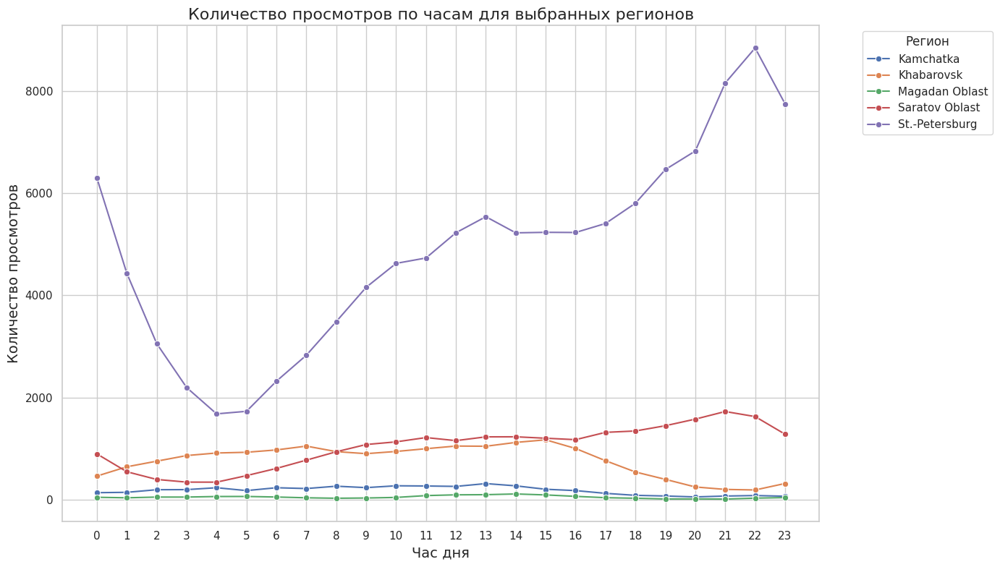

In [46]:
# Определение регионов для сравнения
regions_to_compare = ['Khabarovsk', 'Magadan Oblast', 'Kamchatka', 'Saratov Oblast', 'St.-Petersburg']

# Проверка, существуют ли эти регионы в стандартизированном столбце
existing_regions = train_data['region_standardized'].unique()
missing_regions = [region for region in regions_to_compare if region not in existing_regions]

if missing_regions:
    print(f"Внимание: следующие регионы не найдены после стандартизации: {missing_regions}")
else:
    print("Все выбранные регионы присутствуют в данных.")

# Фильтрация данных для выбранных регионов
comparison_data = train_data[train_data['region_standardized'].isin(regions_to_compare)]

# Группировка данных по региону и часу для подсчёта количества просмотров
views_per_hour_comparison = comparison_data.groupby(['region_standardized', 'event_hour']).size().reset_index(name='view_count')

# Визуализация
plt.figure(figsize=(14, 8))
sns.lineplot(data=views_per_hour_comparison, x='event_hour', y='view_count', hue='region_standardized', marker='o')

# Настройка заголовка и подписей осей
plt.title('Количество просмотров по часам для выбранных регионов', fontsize=16)
plt.xlabel('Час дня', fontsize=14)
plt.ylabel('Количество просмотров', fontsize=14)

# Настройка легенды
plt.legend(title='Регион', bbox_to_anchor=(1.05, 1), loc='upper left')

# Установка диапазона оси X от 0 до 23
plt.xticks(range(0, 24))

# Оптимизация расположения элементов графика
plt.tight_layout()

# Отображение графика
plt.show()


Уникальные стандартизированные регионы:
['Chelyabinsk' 'Bashkortostan Republic' 'St.-Petersburg' 'Moscow' 'Rostov'
 'Moscow Oblast' 'Kursk' 'Kemerovo Oblast' 'Arkhangelskaya' 'Tomsk Oblast'
 'Novosibirsk Oblast' 'Sverdlovsk' "Leningradskaya Oblast'"
 'Krasnodarskiy' 'Tatarstan Republic' 'Belgorod Oblast' 'Kuzbass'
 'Udmurtiya Republic' 'Chuvashia' 'Ryazan Oblast' 'Perm' 'Sakha'
 'Orenburg Oblast' 'Primorye' 'Zabaykalskiy (Transbaikal) Kray'
 'Bryansk Oblast' 'Tver Oblast' 'Stavropol Krai' 'Khabarovsk' 'Penza'
 'Mariy-El Republic' 'Smolensk' 'Tambov' 'Novgorod Oblast'
 'Khakasiya Republic' 'Ulyanovsk' 'Volgograd Oblast' 'Irkutsk Oblast'
 'Komi' 'Nizhny Novgorod Oblast' 'Krasnoyarskiy' 'Kurgan Oblast' 'Kirov'
 'Omsk' 'Vladimir' 'Yaroslavl Oblast' 'Saratov Oblast' 'Khanty-Mansia'
 'Tula' 'Amur Oblast' 'Altay Kray' 'Buryatiya Republic' 'Dagestan'
 'Kaluga' 'Kaliningrad' 'Murmansk' 'Samara Oblast' 'Voronezj' 'Karelia'
 'Lipetsk Oblast' 'Adygeya Republic' 'Ivanovo' 'Oryol oblast' 'Kamchatka'

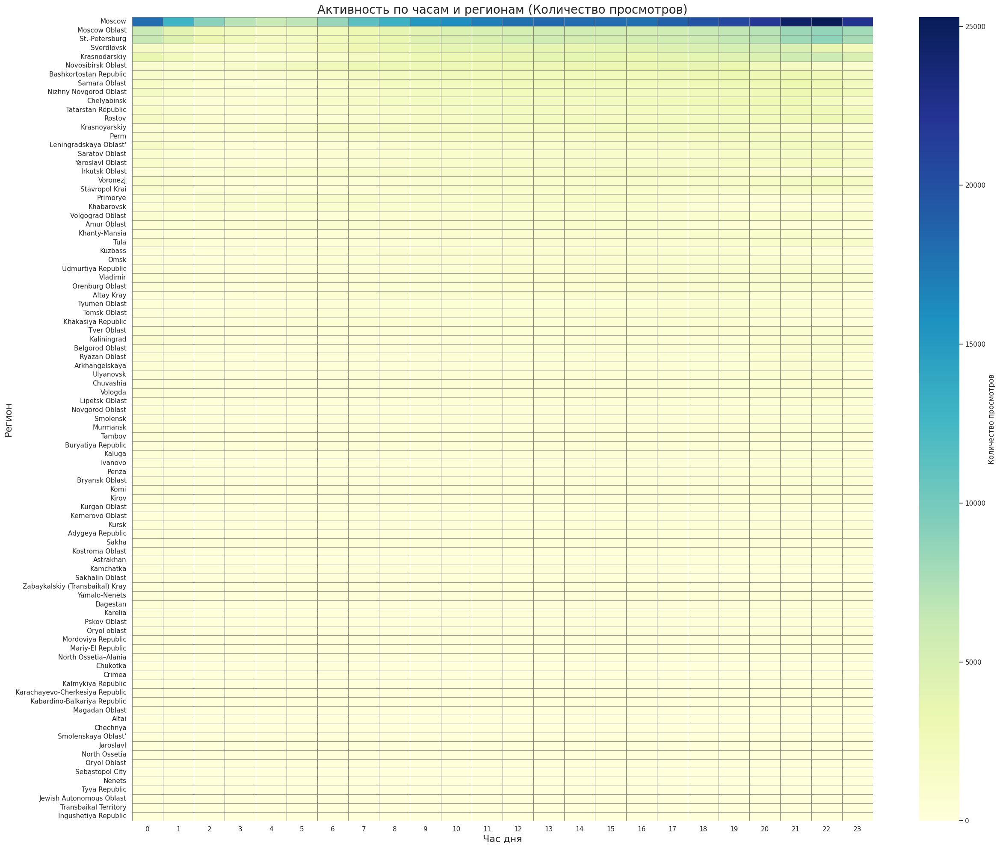

In [47]:
# Проверка уникальных регионов после стандартизации
print("Уникальные стандартизированные регионы:")
print(train_data['region_standardized'].unique())

# Группировка данных по региону и часу для подсчёта количества просмотров
views_per_hour_all_regions = train_data.groupby(['region_standardized', 'event_hour']).size().reset_index(name='view_count')

# Проверка формы полученных данных
print(f"Количество записей после группировки: {views_per_hour_all_regions.shape[0]}")

# Создание сводной таблицы для тепловой карты
pivot_table_all = views_per_hour_all_regions.pivot(index='region_standardized', columns='event_hour', values='view_count')

# Заполнение пропусков нулями (если имеются)
pivot_table_all = pivot_table_all.fillna(0)

# Сортировка регионов по суммарному количеству просмотров (опционально)
pivot_table_all = pivot_table_all.loc[pivot_table_all.sum(axis=1).sort_values(ascending=False).index]

# Визуализация тепловой карты
plt.figure(figsize=(25, 20))
sns.heatmap(pivot_table_all, cmap='YlGnBu', linewidths=.5, linecolor='gray', cbar_kws={'label': 'Количество просмотров'})
plt.title('Активность по часам и регионам (Количество просмотров)', fontsize=20)
plt.xlabel('Час дня', fontsize=16)
plt.ylabel('Регион', fontsize=16)
plt.xticks(rotation=0)  # Оставляем метки часов горизонтальными
plt.yticks(rotation=0)  # Оставляем метки регионов горизонтальными
plt.tight_layout()
plt.show()


In [48]:
import plotly.express as px

# Создание интерактивной тепловой карты
fig = px.imshow(
    pivot_table_all,
    labels=dict(x="Час дня", y="Регион", color="Количество просмотров"),
    x=pivot_table_all.columns,
    y=pivot_table_all.index,
    color_continuous_scale='YlGnBu',
    aspect="auto",
    title='Активность по часам и регионам (Количество просмотров)'
)

# Настройка отображения осей
fig.update_xaxes(side="top")

# Отображение графика
fig.show()


Количество уникальных регионов: 91


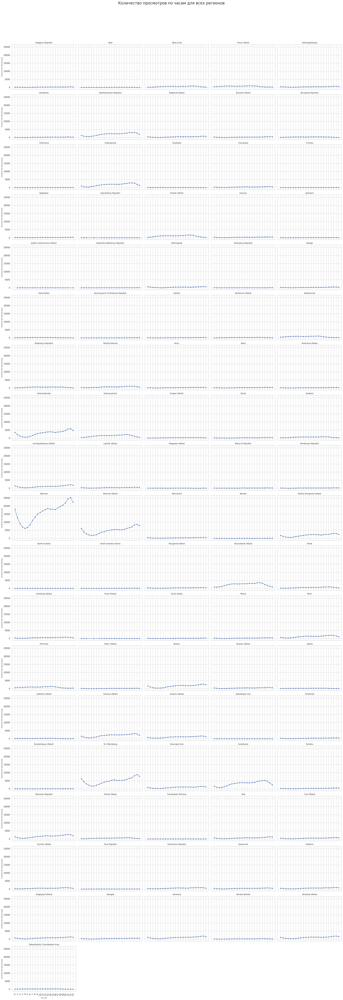

Примеры очищенных названий регионов:
0                Chelyabinsk
1     Bashkortostan Republic
2             St.-Petersburg
3                     Moscow
4                     Moscow
5                     Rostov
6              Moscow Oblast
7                      Kursk
8            Kemerovo Oblast
9             St.-Petersburg
10            St.-Petersburg
11            Arkhangelskaya
12              Tomsk Oblast
13    Bashkortostan Republic
14        Novosibirsk Oblast
15            St.-Petersburg
16                Sverdlovsk
17     Leningradskaya Oblast
18             Krasnodarskiy
19                    Moscow
Name: region_standardized, dtype: object


In [49]:
# Определение количества уникальных регионов
unique_regions = views_per_hour_all_regions['region_standardized'].nunique()
print(f"Количество уникальных регионов: {unique_regions}")

# Определение количества подграфиков в строке и столбце
plots_per_row = 5
num_rows = unique_regions // plots_per_row + int(unique_regions % plots_per_row > 0)

# Создание фигуры и осей
fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(25, num_rows * 4), sharex=True, sharey=True)

# Преобразование axes в одномерный массив для удобства итерации
axes = axes.flatten()

# Перебор регионов и построение графиков
for i, region in enumerate(views_per_hour_all_regions['region_standardized'].unique()):
    region_data = views_per_hour_all_regions[views_per_hour_all_regions['region_standardized'] == region]
    sns.lineplot(ax=axes[i], data=region_data, x='event_hour', y='view_count', marker='o')
    axes[i].set_title(region, fontsize=10)
    axes[i].set_xlabel('Час дня', fontsize=8)
    axes[i].set_ylabel('Количество просмотров', fontsize=8)
    axes[i].set_xticks(range(0, 24))
    axes[i].tick_params(axis='x', rotation=45)
    
# Удаление лишних подграфиков (если есть)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Настройка общего заголовка
plt.suptitle('Количество просмотров по часам для всех регионов', fontsize=20)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Отображение графика
plt.show()

import pandas as pd



# Функция для очистки названий регионов
def clean_region_name(name):
    if isinstance(name, str):
        # Удаляем начальные и конечные кавычки и пробелы
        return name.strip(" '’“”").strip()
    return name

# Применяем функцию к столбцу 'region_standardized'
train_data['region_standardized'] = train_data['region_standardized'].apply(clean_region_name)

# Проверка результатов очистки
print("Примеры очищенных названий регионов:")
print(train_data['region_standardized'].head(20))



In [50]:
# Создание словаря сопоставления регионов с часовыми поясами (в часах относительно UTC)
region_timezone_mapping = {
    'Adygeya Republic': 0,
    'Leningradskaya Oblast': 0,
    'Ryazan Oblast': 0,
    'Oryol Oblast': 0,
    'Smolenskaya Oblast': 0,
    'Altai': +4,
    'Altay Kray': +4,
    'Amur Oblast': +6,
    'Arkhangelskaya': 0,
    'Astrakhan': 0,
    'Bashkortostan Republic': +2,
    'Belgorod Oblast': 0,
    'Bryansk Oblast': 0,
    'Buryatiya Republic': +5,
    'Chechnya': 0,
    'Chelyabinsk': +2,
    'Chukotka': +9,
    'Chuvashia': 0,
    'Crimea': 0,
    'Dagestan': 0,
    'Ingushetiya Republic': 0,
    'Irkutsk Oblast': +5,
    'Ivanovo': 0,
    'Jaroslavl': 0,
    'Jewish Autonomous Oblast': +5,
    'Kabardino-Balkariya Republic': 0,
    'Kaliningrad': -1,
    'Kalmykiya Republic': 0,
    'Kaluga': 0,
    'Kamchatka': +9,
    'Karachayevo-Cherkesiya Republic': 0,
    'Karelia': 0,
    'Kemerovo Oblast': +4,
    'Khabarovsk': +6,
    'Khakasiya Republic': +4,
    'Khanty-Mansia': +2,
    'Kirov': 0,
    'Komi': 0,
    'Kostroma Oblast': 0,
    'Krasnodarskiy': 0,
    'Krasnoyarskiy': +4,
    'Kurgan Oblast': +2,
    'Kursk': 0,
    'Kuzbass': +4,
    'Leningradskaya Oblast': 0,
    'Lipetsk Oblast': 0,
    'Magadan Oblast': +8,
    'Mariy-El Republic': 0,
    'Mordoviya Republic': 0,
    'Moscow': 0,
    'Moscow Oblast': 0,
    'Murmansk': 0,
    'Nenets': 0,
    'Nizhny Novgorod Oblast': 0,
    'North Ossetia': 0,
    'North Ossetia–Alania': 0,
    'Novgorod Oblast': 0,
    'Novosibirsk Oblast': +4,
    'Omsk': +3,
    'Orenburg Oblast': +2,
    'Oryol oblast': 0,
    'Penza': 0,
    'Perm': +2,
    'Primorye': +7,
    'Pskov Oblast': 0,
    'Rostov': 0,
    'Sakha': +6,
    'Sakhalin Oblast': +8,
    'Samara Oblast': +1,
    'Saratov Oblast': +1,
    'Sebastopol City': 0,
    'Smolensk': 0,
    'St.-Petersburg': 0,
    'Stavropol Krai': 0,
    'Sverdlovsk': +2,
    'Tambov': 0,
    'Tatarstan Republic': 0,
    'Tomsk Oblast': +4,
    'Transbaikal Territory': +5,
    'Tula': 0,
    'Tver Oblast': 0,
    'Tyumen Oblast': +2,
    'Tyva Republic': +4,
    'Udmurtiya Republic': +2,
    'Ulyanovsk': 0,
    'Vladimir': 0,
    'Volgograd Oblast': 0,
    'Vologda': 0,
    'Voronezj': 0,
    'Yamalo-Nenets': +2,
    'Yaroslavl Oblast': 0,
    'Zabaykalskiy (Transbaikal) Kray': +6
}


In [51]:
#  Проверка наличия столбца 'region_standardized'
if 'region_standardized' not in train_data.columns:
    print("Столбец 'region_standardized' отсутствует в DataFrame.")
else:
    #  Добавление столбца 'utc_offset' с часовыми поясами
    train_data['utc_offset'] = train_data['region_standardized'].map(region_timezone_mapping)
    
    #  Проверка на отсутствующие значения
    missing_offsets = train_data['utc_offset'].isnull().sum()
    if missing_offsets > 0:
        print(f"Внимание: {missing_offsets} записей имеют неопределённый часовой пояс.")
        # Можно установить неопределённые значения в 0 или другой стандартный часовой пояс
        train_data['utc_offset'] = train_data['utc_offset'].fillna(0)
    else:
        print("Все регионы успешно сопоставлены с часовыми поясами.")
    
    #  Преобразование столбца 'event_timestamp' в тип datetime с учётом часового пояса
    # Важно: не используем utc=True, чтобы сохранить исходный часовой пояс
    train_data['event_timestamp'] = pd.to_datetime(train_data['event_timestamp'])
    
    #  Вычисление локального часа дня с учётом 'utc_offset'
    # Предполагается, что 'event_timestamp' уже содержит информацию о UTC+3
    train_data['local_hour'] = (train_data['event_timestamp'].dt.hour + train_data['utc_offset']) % 24
    
    #  Проверка результата для 'Saratov Oblast' и 'Moscow'
    print("\nПроверка преобразования времени для 'Saratov Oblast' и 'Moscow':")
    print(train_data[train_data['region_standardized'].isin(['Saratov Oblast', 'Moscow'])][
        ['event_timestamp', 'utc_offset', 'local_hour']
    ].head())


Все регионы успешно сопоставлены с часовыми поясами.

Проверка преобразования времени для 'Saratov Oblast' и 'Moscow':
             event_timestamp  utc_offset  local_hour
3  2024-06-01 23:03:42+03:00           0          23
4  2024-06-01 22:48:09+03:00           0          22
19 2024-06-01 23:39:57+03:00           0          23
33 2024-06-01 06:54:32+03:00           0           6
34 2024-06-01 17:09:14+03:00           0          17


In [52]:
# Проверка наличия 'Saratov Oblast' в словаре
if 'Moscow' in region_timezone_mapping:
    saratov_timezone = region_timezone_mapping['Moscow']
    print(f"Часовой пояс для 'Saratov Oblast': UTC{'+{}'.format(saratov_timezone) if saratov_timezone >=0 else saratov_timezone}")
else:
    print("'Mosc' отсутствует в словаре 'region_timezone_mapping'.")


Часовой пояс для 'Saratov Oblast': UTC+0


In [53]:
# Фильтрация данных для 'Saratov Oblast'
saratov_data = train_data[train_data['region_standardized'] == 'Saratov Oblast']

# Проверка уникальных значений 'utc_offset' для 'Saratov Oblast'
unique_offsets = saratov_data['utc_offset'].unique()
print(f"Уникальные значения 'utc_offset' для 'Saratov Oblast': {unique_offsets}")

# Пример первых 5 записей для 'Saratov Oblast'
print("\nПервые 5 записей для 'Saratov Oblast':")
print(saratov_data.head())


Уникальные значения 'utc_offset' для 'Saratov Oblast': [1]

Первые 5 записей для 'Saratov Oblast':
              event_timestamp               region ua_device_type  \
125 2024-06-01 17:26:24+03:00       Saratov Oblast         tablet   
159 2024-06-01 23:12:36+03:00       Saratov Oblast     smartphone   
454 2024-06-01 21:35:45+03:00       Saratov Oblast     smartphone   
618 2024-06-01 15:52:56+03:00       Saratov Oblast     smartphone   
621 2024-06-01 17:58:00+03:00  Saratovskaya Oblast     smartphone   

    ua_client_type    ua_os  ua_client_name  total_watchtime  age     sex  \
125     mobile app  Android          Rutube             2580   23  female   
159     mobile app  Android          Rutube             2552   27    male   
454     mobile app  Android          Rutube             2159   26  female   
618     mobile app  Android          Rutube             1880   33  female   
621        browser  Android  Yandex Browser              174   29    male   

     age_class      cat

In [54]:
# Определение топ-20 регионов по общему количеству просмотров
top_20_regions = train_data['region_standardized'].value_counts().nlargest(20).index.tolist()

print("Топ-20 регионов по количеству просмотров:")
for i, region in enumerate(top_20_regions, 1):
    print(f"{i}. {region}")


Топ-20 регионов по количеству просмотров:
1. Moscow
2. Moscow Oblast
3. St.-Petersburg
4. Sverdlovsk
5. Krasnodarskiy
6. Novosibirsk Oblast
7. Bashkortostan Republic
8. Samara Oblast
9. Nizhny Novgorod Oblast
10. Chelyabinsk
11. Tatarstan Republic
12. Rostov
13. Krasnoyarskiy
14. Perm
15. Leningradskaya Oblast
16. Saratov Oblast
17. Yaroslavl Oblast
18. Irkutsk Oblast
19. Voronezj
20. Stavropol Krai


In [55]:
# Фильтрация данных для топ-20 регионов
top_20_data = train_data[train_data['region_standardized'].isin(top_20_regions)]

# Группировка по региону и локальному часу для подсчёта количества просмотров
views_per_hour_top20 = top_20_data.groupby(['region_standardized', 'local_hour']).size().reset_index(name='view_count')

# Проверка первых 10 записей
print("\nПервые 10 записей после группировки:")
print(views_per_hour_top20.head(10))



Первые 10 записей после группировки:
      region_standardized  local_hour  view_count
0  Bashkortostan Republic           0        2698
1  Bashkortostan Republic           1        2031
2  Bashkortostan Republic           2        1284
3  Bashkortostan Republic           3         867
4  Bashkortostan Republic           4         626
5  Bashkortostan Republic           5         593
6  Bashkortostan Republic           6         736
7  Bashkortostan Republic           7        1034
8  Bashkortostan Republic           8        1345
9  Bashkortostan Republic           9        1650


In [56]:
import plotly.express as px

# Создание интерактивного линейного графика
fig = px.line(
    views_per_hour_top20,
    x='local_hour',
    y='view_count',
    color='region_standardized',
    title='Сравнение Активности по Часам дня для Топ-20 Регионов',
    labels={
        'local_hour': 'Час дня (локальное время)',
        'view_count': 'Количество просмотров',
        'region_standardized': 'Регион'
    },
    markers=True
)

# Настройка осей
fig.update_layout(
    xaxis=dict(tickmode='linear', tick0=0, dtick=1),
    legend=dict(
        title='Регион',
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    ),
    margin=dict(l=40, r=40, t=80, b=40)  # Уменьшаем отступы для лучшего размещения
)

# Отображение графика
fig.show()


In [57]:
# Получение списка уникальных регионов в порядке их появления
unique_regions = train_data['region_standardized'].unique()

# Выбор последних 20 регионов
last_20_regions = unique_regions[-20:]

print("Последние 20 регионов:")
for i, region in enumerate(last_20_regions, 1):
    print(f"{i}. {region}")


Последние 20 регионов:
1. Karachayevo-Cherkesiya Republic
2. Chukotka
3. Mordoviya Republic
4. Kostroma Oblast
5. Yamalo-Nenets
6. Magadan Oblast
7. Altai
8. Astrakhan
9. Kabardino-Balkariya Republic
10. Jaroslavl
11. Sakhalin Oblast
12. Sebastopol City
13. Oryol Oblast
14. Smolenskaya Oblast
15. Nenets
16. Jewish Autonomous Oblast
17. Ingushetiya Republic
18. North Ossetia
19. Transbaikal Territory
20. Tyva Republic


In [58]:
# Фильтрация данных для последних 20 регионов
last_20_data = train_data[train_data['region_standardized'].isin(last_20_regions)]

# Группировка по региону и локальному часу для подсчёта количества просмотров
views_per_hour_last20 = last_20_data.groupby(['region_standardized', 'local_hour']).size().reset_index(name='view_count')

# Проверка первых 10 записей
print("\nПервые 10 записей после группировки:")
print(views_per_hour_last20.head(10))



Первые 10 записей после группировки:
  region_standardized  local_hour  view_count
0               Altai           0          68
1               Altai           1          47
2               Altai           2          38
3               Altai           3          22
4               Altai           4           8
5               Altai           5           8
6               Altai           6           5
7               Altai           7          13
8               Altai           8          23
9               Altai           9          41


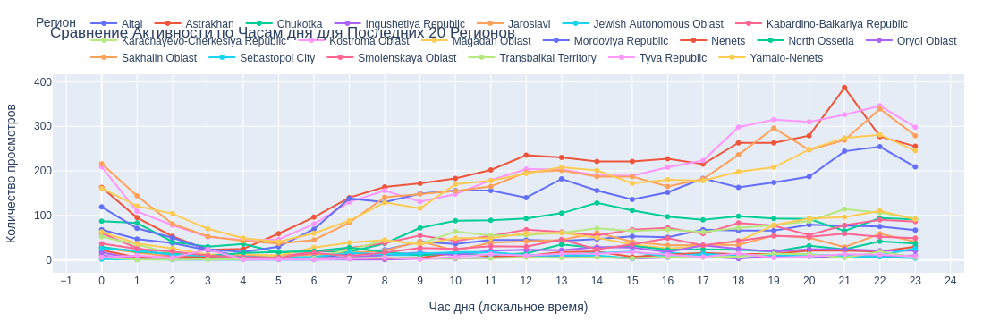

In [59]:
import plotly.express as px

# Создание интерактивного линейного графика
fig = px.line(
    views_per_hour_last20,
    x='local_hour',
    y='view_count',
    color='region_standardized',
    title='Сравнение Активности по Часам дня для Последних 20 Регионов',
    labels={
        'local_hour': 'Час дня (локальное время)',
        'view_count': 'Количество просмотров',
        'region_standardized': 'Регион'
    },
    markers=True
)

# Настройка осей и легенды
fig.update_layout(
    xaxis=dict(tickmode='linear', tick0=0, dtick=1),
    legend=dict(
        title='Регион',
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    ),
    margin=dict(l=40, r=40, t=80, b=40)
)

# Отображение графика
fig.show()


20 регионов с наименьшим количеством просмотров:
1. Mariy-El Republic
2. North Ossetia–Alania
3. Chukotka
4. Crimea
5. Kalmykiya Republic
6. Karachayevo-Cherkesiya Republic
7. Kabardino-Balkariya Republic
8. Magadan Oblast
9. Altai
10. Chechnya
11. Smolenskaya Oblast
12. Jaroslavl
13. North Ossetia
14. Oryol Oblast
15. Sebastopol City
16. Nenets
17. Tyva Republic
18. Jewish Autonomous Oblast
19. Transbaikal Territory
20. Ingushetiya Republic


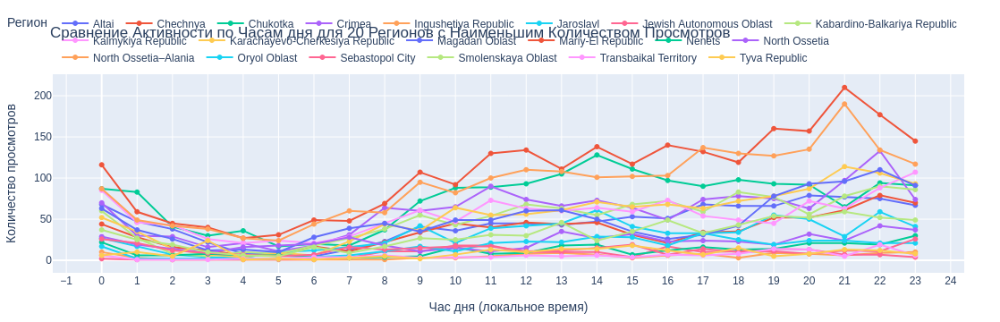

In [60]:

# 1. Определение количества просмотров для каждого региона
region_view_counts = train_data['region_standardized'].value_counts()

# 2. Выбор 20 регионов с наименьшим количеством просмотров
bottom_20_regions = region_view_counts.tail(20).index.tolist()

print("20 регионов с наименьшим количеством просмотров:")
for i, region in enumerate(bottom_20_regions, 1):
    print(f"{i}. {region}")

# 3. Фильтрация данных для выбранных регионов
bottom_20_data = train_data[train_data['region_standardized'].isin(bottom_20_regions)]

# 4. Группировка данных по региону и локальному часу для подсчёта количества просмотров
views_per_hour_bottom20 = bottom_20_data.groupby(['region_standardized', 'local_hour']).size().reset_index(name='view_count')

# 5. Визуализация: Интерактивный Линейный График с Plotly
fig = px.line(
    views_per_hour_bottom20,
    x='local_hour',
    y='view_count',
    color='region_standardized',
    title='Сравнение Активности по Часам дня для 20 Регионов с Наименьшим Количеством Просмотров',
    labels={
        'local_hour': 'Час дня (локальное время)',
        'view_count': 'Количество просмотров',
        'region_standardized': 'Регион'
    },
    markers=True
)

# Настройка осей и легенды
fig.update_layout(
    xaxis=dict(tickmode='linear', tick0=0, dtick=1),
    legend=dict(
        title='Регион',
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    ),
    margin=dict(l=40, r=40, t=80, b=40)
)

# Отображение графика
fig.show()